##**Note the following cannot be run unless the exact data files from The Cancer Genome Atlas are downloaded, which is extremely time-consuming. Please refer to Maker Video for a visuals-based demonstration of the project.**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


**Establishing necessary data paths for biopsy data/WSI data files stored as .svs files. (Opening .tar.gz files from The Cancer Genome Atlas (TCGA) has already been performed)**

In [ ]:
tcga_normal_files = [
    '036a0d0b-83b8-4144-9d81-63e5b0a61c6b/TCGA-44-2656-11A-02-TS2.8C5BE3BC-139F-4C79-97D2-0CC8A0EBA5F9.svs',
'059d9d09-95cd-4c05-925e-bbde03edd2c8/TCGA-44-6775-11A-03-TS3.1BE1238F-E7DC-425D-A28D-D0EA175F0DFF.svs',
'0dea7bf0-721e-4fb9-beef-3024093ec1b1/TCGA-44-6147-11A-05-TS5.41088AE2-F335-4BA2-B096-F9135208100D.svs',
'21235b67-ac53-4894-a02a-3198ee49821a/TCGA-44-2666-11A-03-TS3.65EDB2DC-8D45-443D-81D2-A69AD8DDDA32.svs',
'2329c00b-a3d4-457f-add2-13e02f706683/TCGA-44-6146-11A-03-TS3.2CE81C91-D631-4AE1-AF75-609BE4B780CF.svs',
'2911f945-af08-4509-8e58-5d03aa84736b/TCGA-49-AAR0-11A-01-TSA.0B0F6078-45B9-4BAC-91E3-560F55D5EBF0.svs',
'50cc4b93-d4bc-4d29-bbc2-051a78050124/TCGA-44-4112-11A-03-TSC.56057295-8700-4E13-8AC8-A03FAFFCE781.svs',
'54aeca8d-c325-4548-8de6-e5af34429da6/TCGA-44-4112-11A-02-TSB.273D61E4-3585-4EF2-96E3-C854E2D231C1.svs',
'64884887-c28a-42e5-95c4-678424848578/TCGA-44-6147-11A-02-TS2.8E142081-7AA9-4B36-BBA2-A4616292B45A.svs',
'8b7dead4-4a47-4180-87d2-3cb0cfaabea2/TCGA-44-6146-11A-02-TS2.C2102AB4-AA0D-4C49-A61A-DBCF01A8F410.svs',
'94f7ae6c-58a4-42bc-a144-fdb0c36f57a4/TCGA-49-AAQV-11A-01-TSA.DD8E00B5-89C3-45A0-98F3-7CCD2C99E430.svs',
'a9856ce3-f297-4635-8e9c-3af03f35b8a0/TCGA-44-5645-11A-02-TS2.F7F3BB9A-F734-4616-A605-560A9A357F9A.svs',
'b26caaa1-ee26-440c-930a-ff8887d954f4/TCGA-44-5645-11A-03-TS3.1DF60D63-00A1-42A4-AB5E-5327AC83AB29.svs',
'c1080d2b-a002-4103-95a7-746583c999e0/TCGA-44-2666-11A-02-TS2.AF813A5E-5F00-40B8-B4B6-F72AF055B876.svs',
'cd539468-016b-4e65-96f1-9915d5191004/TCGA-44-2656-11A-03-TS3.E842A27F-1AE8-4E06-89C9-13105DBE5DC9.svs',
'eb929b8b-fc95-4bf0-8450-8ba8f66569ab/TCGA-49-AARE-11A-01-TS1.DC9E89C9-86E8-452D-AD64-225A978B84E2.svs',
'f17c9c8f-c2a8-4031-9c33-92cbdea97889/TCGA-44-6775-11A-02-TS2.2395DC26-FED1-4B8D-B76F-029863528E71.svs']

In [ ]:
tcga_lusc_files = ['16017d53-42b4-4caf-884c-cd4959748bd7/TCGA-77-A5G3-01A-03-TS3.01361151-FAF9-4E3C-AC6D-AFCE8166EE8E.svs',
'240ba6ae-22f0-47c5-8bcb-4ae48e34c87f/TCGA-56-8629-01A-01-TS1.23884c3c-6c60-43bc-bf5a-6eff6f7491e3.svs',
'364cb3fa-6015-4e07-a7ac-b69062254cc6/TCGA-63-7020-01A-01-BS1.12264877-f722-4332-9856-a206b6532a90.svs',
'458e1631-a03c-456b-821b-0c58dadd9e53/TCGA-66-2744-01A-01-BS1.31ef97ac-6f7d-45a6-a4b6-d15120455d57.svs',
'6a5e649c-630a-4123-a1d1-05c36d99f009/TCGA-37-3783-01A-01-TS1.053386eb-d46d-4986-ad16-3df69c133cb8.svs',
'8be8c3ea-70f6-405f-a52e-e5991a28bd93/TCGA-85-7699-01A-01-TS1.ad1db001-2f9e-4831-a219-f0d5b431206f.svs',
'ae6fef43-a7dd-47ee-95f8-66a9feddbf09/TCGA-33-4582-01A-01-TS1.2e04ecb7-dfe2-4c3e-8158-712023073941.svs',
'bc44f01f-55eb-484d-a7df-ca90882ece44/TCGA-39-5022-01A-02-BS2.4c32c9bd-80dd-499d-87d2-1516981ea8d4.svs',
'bf25a717-4902-40a5-a522-ed1fe1726cad/TCGA-NC-A5HM-01A-01-TSA.13947B81-4DB8-464A-9225-73DAB87BDABF.svs',
'c713924d-7769-4ddb-a317-ee70cb1949f8/TCGA-85-A4QR-01A-01-TSA.D4503206-7F6F-4939-B2DB-207D5FE2FE3D.svs']

In [ ]:
new_tcga_lusc_files = ['240ba6ae-22f0-47c5-8bcb-4ae48e34c87f/TCGA-56-8629-01A-01-TS1.23884c3c-6c60-43bc-bf5a-6eff6f7491e3.svs',
'458e1631-a03c-456b-821b-0c58dadd9e53/TCGA-66-2744-01A-01-BS1.31ef97ac-6f7d-45a6-a4b6-d15120455d57.svs',
'50e706e8-f80d-41ce-b8a1-4c56b5d74473/TCGA-34-2596-01A-01-TS1.9e71291e-b6bf-47cd-ae17-17320ccb3f6c.svs',
'6a2b48f0-a8db-452a-b6e7-4eb343760fe8/TCGA-NC-A5HO-01A-01-TS1.62FF3313-6DFC-4F64-9E69-9D1C852A57D4.svs',
'71727bf1-b1b4-4d58-ae1d-e442303e07d4/TCGA-56-7223-01A-01-TS1.413074b3-0f68-4dc0-a4e9-b06f3525bf4f.svs',
'746e2e68-dd76-4880-a0e6-93fd94f17e70/TCGA-77-8140-01A-01-TS1.c7d0df63-5c46-4739-a2e8-5f8a97fc85f4.svs',
'8be8c3ea-70f6-405f-a52e-e5991a28bd93/TCGA-85-7699-01A-01-TS1.ad1db001-2f9e-4831-a219-f0d5b431206f.svs',
'978bd3e6-3595-4b43-a0ce-31920c6b90c4/TCGA-94-A4VJ-01A-01-TSA.416CD92F-ADBE-4DE1-AE92-BE0260DF37AF.svs',
'a5dadfa8-26ab-40d7-b12e-c68a47f47aad/TCGA-96-8170-01A-01-TS1.1ad24fe9-758d-4a9d-8510-c1c73368b672.svs',
'f3ab8928-43ef-4547-ba15-7c99c8575f73/TCGA-34-2596-01A-01-BS1.97310b4d-968a-4ade-b9f0-16f833a1698d.svs']

In [ ]:
pip install openslide-python


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.0/359.0 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for openslide-python: filename=openslide_python-1.3.1-cp310-cp310-linux_x86_64.whl size=33553 sha256=87258025f220ed9067769ad190a8048f79d816a5450812eeba3a86b245dc851a
  Stored in directory: /root/.cache/pip/wheels/79/79/fa/29a0087493c69dff7fd0b70fab5d6771002a531010161d2d97
Successfully built openslide-python


In [ ]:
pip install openslide

In [ ]:
pip install gdc-client

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
gdc-client download -m /content/drive/My Drive/Colab Notebooks/gdc_manifest.2023-11-23.txt

In [ ]:
!apt update && apt install -y openslide-tools
!pip install openslide-python

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [673 kB]
Hit:5 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:6 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Get:8 http://security.ubuntu.com/ubuntu jammy-security/universe amd64 Packages [1,065 kB]
Hit:9 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Get:10 http://security.ubuntu.com/ubuntu jammy-security/restricted amd64 Packages [1,751 kB]
Hit:11 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:12 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [109 kB]
Get:13 htt

In [ ]:
directory_validation_files_list = ["036a0d0b-83b8-4144-9d81-63e5b0a61c6b/TCGA-44-2656-11A-02-TS2.8C5BE3BC-139F-4C79-97D2-0CC8A0EBA5F9.svs",
"059d9d09-95cd-4c05-925e-bbde03edd2c8/TCGA-44-6775-11A-03-TS3.1BE1238F-E7DC-425D-A28D-D0EA175F0DFF.svs",
"0dea7bf0-721e-4fb9-beef-3024093ec1b1/TCGA-44-6147-11A-05-TS5.41088AE2-F335-4BA2-B096-F9135208100D.svs",
"21235b67-ac53-4894-a02a-3198ee49821a/TCGA-44-2666-11A-03-TS3.65EDB2DC-8D45-443D-81D2-A69AD8DDDA32.svs",
"2329c00b-a3d4-457f-add2-13e02f706683/TCGA-44-6146-11A-03-TS3.2CE81C91-D631-4AE1-AF75-609BE4B780CF.svs",
"2911f945-af08-4509-8e58-5d03aa84736b/TCGA-49-AAR0-11A-01-TSA.0B0F6078-45B9-4BAC-91E3-560F55D5EBF0.svs",
"50cc4b93-d4bc-4d29-bbc2-051a78050124/TCGA-44-4112-11A-03-TSC.56057295-8700-4E13-8AC8-A03FAFFCE781.svs",
"54aeca8d-c325-4548-8de6-e5af34429da6/TCGA-44-4112-11A-02-TSB.273D61E4-3585-4EF2-96E3-C854E2D231C1.svs",
"64884887-c28a-42e5-95c4-678424848578/TCGA-44-6147-11A-02-TS2.8E142081-7AA9-4B36-BBA2-A4616292B45A.svs",
"8b7dead4-4a47-4180-87d2-3cb0cfaabea2/TCGA-44-6146-11A-02-TS2.C2102AB4-AA0D-4C49-A61A-DBCF01A8F410.svs",
"94f7ae6c-58a4-42bc-a144-fdb0c36f57a4/TCGA-49-AAQV-11A-01-TSA.DD8E00B5-89C3-45A0-98F3-7CCD2C99E430.svs",
"a9856ce3-f297-4635-8e9c-3af03f35b8a0/TCGA-44-5645-11A-02-TS2.F7F3BB9A-F734-4616-A605-560A9A357F9A.svs",
"b26caaa1-ee26-440c-930a-ff8887d954f4/TCGA-44-5645-11A-03-TS3.1DF60D63-00A1-42A4-AB5E-5327AC83AB29.svs",
"c1080d2b-a002-4103-95a7-746583c999e0/TCGA-44-2666-11A-02-TS2.AF813A5E-5F00-40B8-B4B6-F72AF055B876.svs",
"cd539468-016b-4e65-96f1-9915d5191004/TCGA-44-2656-11A-03-TS3.E842A27F-1AE8-4E06-89C9-13105DBE5DC9.svs",
"eb929b8b-fc95-4bf0-8450-8ba8f66569ab/TCGA-49-AARE-11A-01-TS1.DC9E89C9-86E8-452D-AD64-225A978B84E2.svs",
"f17c9c8f-c2a8-4031-9c33-92cbdea97889/TCGA-44-6775-11A-02-TS2.2395DC26-FED1-4B8D-B76F-029863528E71.svs"]

In [ ]:
directory_files_str_list = ["0ee0dbf6-90ac-4892-89d9-321775122ea4/TCGA-85-8481-01A-01-TS1.6cd0f1a3-5fe6-497d-9076-32cd03c59ee4.svs",
"195b38d8-36f1-4306-849c-87281651ead3/TCGA-77-7463-01A-01-TS1.15135cd6-7a54-498d-8178-42df23ab7f00.svs",
"240ba6ae-22f0-47c5-8bcb-4ae48e34c87f/TCGA-56-8629-01A-01-TS1.23884c3c-6c60-43bc-bf5a-6eff6f7491e3.svs",
"33efd1f2-4d7c-4b4c-82b9-560ef47b6f9f/TCGA-77-7338-01A-01-BS1.654045da-6384-4961-ac15-6afb85bf073b.svs",
"452079b0-75fa-4994-ba8c-642748dae0b9/TCGA-96-A4JK-01A-01-TSA.E513EF69-3CB7-4EE8-A31D-4DC9839FBBAC.svs",
"4a14f117-5023-4f21-ba7a-4d4852ace7b7/TCGA-56-8622-01A-01-TS1.8e6fcbf9-046d-45bf-9d16-8d7bb8141b79.svs",
"4b81379f-d5b0-4319-927e-ae6247f7725c/TCGA-56-8628-01A-01-TS1.6cce3dc4-a720-4a58-8262-c683fbcbcdfb.svs",
"513f5958-8ae8-4a46-acdc-30a64d3e2dc0/TCGA-43-6771-01A-01-BS1.5851788a-d535-4bab-8e8c-bf1ef8408a2b.svs",
"598806bd-638f-416b-abc9-a52a250ce0c8/TCGA-56-A4ZJ-01A-01-TS1.5907CB20-7E15-4689-9C2C-0E1FB9D3108A.svs",
"5ff2f123-731d-488a-852e-8db59bbb51f4/TCGA-43-6771-01A-01-TS1.8e662698-6d0f-4ec5-8389-0053cb008442.svs",
"66def1f7-5360-472a-8bf0-978c04f4277d/TCGA-77-7338-01A-01-TS1.4436243f-fc72-4147-bd18-ac410eb8acb4.svs",
"6a2b48f0-a8db-452a-b6e7-4eb343760fe8/TCGA-NC-A5HO-01A-01-TS1.62FF3313-6DFC-4F64-9E69-9D1C852A57D4.svs",
"7b14bf4e-03b3-488e-9ae0-b02e61a36b83/TCGA-77-7463-01A-01-BS1.b2b563f8-3864-4ee3-a6d3-02cbdcf333f5.svs",
"7bbbfb5c-5da9-4a35-ba71-1aa3df745ba6/TCGA-43-5668-01A-01-BS1.3883e3ab-916c-4045-aa2a-c8bd446f63cc.svs",
"8696084c-ae25-4d61-b012-d257cf6cd31d/TCGA-85-7844-01A-01-TS1.4b71b3ec-9ce3-4010-bb43-6051fdc94594.svs",
"8d7be88f-afc0-45f8-8e71-4f749323d33f/TCGA-43-5668-01A-01-TS1.19a8b7fc-fb43-415a-a294-8c8e4175a081.svs",
"905be698-4146-4871-8003-e84348263313/TCGA-77-7465-01A-01-TS1.2fdfbde6-7d32-448e-ae83-5ddac616a9a6.svs",
"978bd3e6-3595-4b43-a0ce-31920c6b90c4/TCGA-94-A4VJ-01A-01-TSA.416CD92F-ADBE-4DE1-AE92-BE0260DF37AF.svs",
"9bc20dd2-cb38-476e-b89e-2852b7426df7/TCGA-NC-A5HN-01A-01-TS1.21A22B8D-B6EC-4895-9547-41376594A24D.svs",
"9fe58b35-1020-4b32-b56a-a95d6ffd2f66/TCGA-90-7766-01A-01-BS1.06d0329b-b0f2-4967-a179-150ba4f02404.svs",
"a5dadfa8-26ab-40d7-b12e-c68a47f47aad/TCGA-96-8170-01A-01-TS1.1ad24fe9-758d-4a9d-8510-c1c73368b672.svs",
"b552aec3-62e2-4317-b963-30b8f47f7f63/TCGA-85-7844-01A-01-BS1.64e1a162-d980-471f-9f4e-7e37848ac519.svs",
"be25cd95-d4ad-46d8-bb9b-dbc57ea22834/TCGA-39-5016-01A-01-TS1.d2919568-4db2-4676-bb29-ea31af18a23e.svs",
"bf25a717-4902-40a5-a522-ed1fe1726cad/TCGA-NC-A5HM-01A-01-TSA.13947B81-4DB8-464A-9225-73DAB87BDABF.svs",
"c68e35a7-74e0-4ce4-aebd-c91a0ea60c12/TCGA-NC-A5HG-01A-01-TS1.D056354C-FD4A-4088-84EB-9CAE7745C231.svs",
"c713924d-7769-4ddb-a317-ee70cb1949f8/TCGA-85-A4QR-01A-01-TSA.D4503206-7F6F-4939-B2DB-207D5FE2FE3D.svs",
"e5fa0c10-b671-4bfb-a8ac-05b5f22ca7df/TCGA-56-A4ZK-01A-01-TS1.E1A6517C-A391-4EA4-83D4-84CD8BA6D7C8.svs",
"efd65f69-0ff7-4f93-810b-94951cdf0dca/TCGA-NC-A5HH-01A-01-TS1.DD0360BB-775E-46B2-9BF7-F86F2A181CA6.svs",
"f2187d18-a0a0-481d-8904-caf6c128e8b4/TCGA-77-7337-01A-01-BS1.c9028740-8c95-464c-9b96-87631095a2c3.svs",
"f4a700ec-2441-409c-9f0c-92af46f4568c/TCGA-39-5016-01A-01-BS1.7941fae9-55ae-4138-aed2-fbdc8f1ea5d2.svs",
"f5e9ee46-a02e-46db-98e7-9a2f2d360b38/TCGA-98-8022-01A-01-TS1.0f3dfaf4-a192-4903-a08e-2e90994350df.svs",
"faf3dcc9-9c3d-42ba-8dcb-c7dcd62fdf1f/TCGA-96-A4JL-01A-01-TSA.3FA7182D-09EC-469A-92E2-EFFDC286913C.svs"]

In [ ]:
directory_files_str_list = ["62371498-324b-4c06-8509-b4a0e5916fac/TCGA-86-7711-01A-01-BS1.3e7f1c61-29a1-49ec-9c83-247cf930946d.svs"]

**Defining method for tiling whole slide imaging (WSI) files using the OpenSlide library**

In [ ]:
# https://youtu.be/QntLBvUZR5c --> credit
"""
OpenSlide can read virtual slides in several formats:

Aperio (.svs, .tif)
Hamamatsu (.ndpi, .vms, .vmu)
Leica (.scn)
MIRAX (.mrxs)
Philips (.tiff)
Sakura (.svslide)
Trestle (.tif)
Ventana (.bif, .tif)
Generic tiled TIFF (.tif)

OpenSlide allows reading a small amount of image data at the resolution
closest to a desired zoom level.

pip install openslide-python

then download the latest windows binaries
https://openslide.org/download/

Extract the contents to a place that you can locate later.

If you are getting the error: [WinError 126] The specified module could not be found

Open the lowlevel.py file located in:
    lib\site-packages\openslide

Add this at the top, after from __future__ import division, in the lowlevel.py
os.environ['PATH'] = "path+to+binary" + ";" + os.environ['PATH']
path+to+binary is the path to your windows binaries that you just downloaded.

In my case, it looks like this.

import os
os.environ['PATH'] = "C:/Users/Admin/anaconda3/envs/py37/lib/site-packages/openslide/openslide-win64-20171122/bin" + ";" + os.environ['PATH']

A few useful commands to locate the sitepackages directory

import sys
for p in sys.path:
    print(p)


"""

#import pyvips
from openslide import open_slide
from openslide.deepzoom import DeepZoomGenerator
import openslide
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt

total_data = []
def tile_wsi(filepath, output_directory):
#Load the slide file (svs) into an object.
  slide = open_slide(filepath)
  image = Image.open(filepath)
  rgb = np.asarray(image)
  print("SHAPE: " + str(rgb.size))

  slide_props = slide.properties
  print(slide_props)

  print("Vendor is:", slide_props['openslide.vendor'])
  print("Pixel size of X in um is:", slide_props['openslide.mpp-x'])
  print("Pixel size of Y in um is:", slide_props['openslide.mpp-y'])

  #Objective used to capture the image
  objective = float(slide.properties[openslide.PROPERTY_NAME_OBJECTIVE_POWER])
  print("The objective power is: ", objective)

  # get slide dimensions for the level 0 - max resolution level
  slide_dims = slide.dimensions
  print(slide_dims)

  #Get a thumbnail of the image and visualize
  slide_thumb_600 = slide.get_thumbnail(size=(600, 600))
  slide_thumb_600.show()

  #Convert thumbnail to numpy array
  slide_thumb_600_np = np.array(slide_thumb_600)
  plt.figure(figsize=(8,8))
  plt.imshow(slide_thumb_600_np)


  #Get slide dims at each level. Remember that whole slide images store information
  #as pyramid at various levels
  dims = slide.level_dimensions

  num_levels = len(dims)
  print("Number of levels in this image are:", num_levels)

  print("Dimensions of various levels in this image are:", dims)

  #By how much are levels downsampled from the original image?
  factors = slide.level_downsamples
  print("Each level is downsampled by an amount of: ", factors)

  #Copy an image from a level
  level3_dim = dims[1]
  #Give pixel coordinates (top left pixel in the original large image)
  #Also give the level number (for level 3 we are providing a valueof 2)
  #Size of your output image
  #Remember that the output would be a RGBA image (Not, RGB)
  level3_img = slide.read_region((0,0), 1, level3_dim) #Pillow object, mode=RGBA

  #Convert the image to RGB
  level3_img_RGB = level3_img.convert('RGB')
  level3_img_RGB.show()

  #Convert the image into numpy array for processing
  level3_img_np = np.array(level3_img_RGB)
  plt.imshow(level3_img_np)


  #Return the best level for displaying the given downsample.
  SCALE_FACTOR = 32
  best_level = slide.get_best_level_for_downsample(SCALE_FACTOR)
  #Here it returns the best level to be 2 (third level)
  #If you change the scale factor to 2, it will suggest the best level to be 0 (our 1st level)
  #################################

  #Generating tiles for deep learning training or other processing purposes
  #We can use read_region function and slide over the large image to extract tiles
  #but an easier approach would be to use DeepZoom based generator.
  # https://openslide.org/api/python/

  #Generate object for tiles using the DeepZoomGenerator
  tiles = DeepZoomGenerator(slide, tile_size=224, overlap=0, limit_bounds=False)
  #Here, we have divided our svs into tiles of size 256 with no overlap.
  #The tiles object also contains data at many levels.
  #To check the number of levels
  print("The number of levels in the tiles object are: ", tiles.level_count)

  print("The tile level count is: ", tiles.level_tiles)
  print("The dimensions of data in each level are: ", tiles.level_dimensions)

  #Total number of tiles in the tiles object
  print("Total number of tiles = : ", tiles.tile_count)

  #How many tiles at a specific level?
  level_num = 14
  print("Tiles shape at level ", level_num, " is: ", tiles.level_tiles[level_num])
  print("This means there are ", tiles.level_tiles[level_num][0]*tiles.level_tiles[level_num][1], " total tiles in this level")

  #Dimensions of the tile (tile size) for a specific tile from a specific layer
  tile_dims = tiles.get_tile_dimensions(3, (0,0)) #Provide deep zoom level and address (column, row)
  print("tile dims: " + str(tile_dims))

  #Tile count at the highest resolution level (level 16 in our tiles)
  tile_count_in_large_image = tiles.level_tiles[1] #126 x 151 (32001/256 = 126 with no overlap pixels)
  print("count: " + str(tile_count_in_large_image))
  #Check tile size for some random tile
  # tile_dims = tiles.get_tile_dimensions(1, (2,2))
  # #Last tiles may not have full 256x256 dimensions as our large image is not exactly divisible by 256
  # tile_dims = tiles.get_tile_dimensions(1, (5,3))


  single_tile = tiles.get_tile(5, (0, 0)) #Provide deep zoom level and address (column, row)
  single_tile_RGB = single_tile.convert('RGB')
  single_tile_RGB.show()

  ###### Saving each tile to local directory
  cols, rows = tiles.level_tiles[14]

  import os
  count = 0
  for row in range(rows):
      for col in range(cols):
          tile_name = os.path.join(output_directory, '%s_%d_%d' % (filepath.split('/')[-1][:-4], col, row))
          temp_tile = tiles.get_tile(14, (col, row))
          pixels = temp_tile.getdata()          # get the pixels as a flattened sequence
          white_thresh = 255
          nwhite = 0
          for pixel in pixels:
              if 600 < sum(pixel) < 765:
                  nwhite += 1

          n = len(pixels)

          temp_tile_RGB = temp_tile.convert('RGB')
          temp_tile_np = np.array(temp_tile_RGB)
          plt.imsave(tile_name + ".png", temp_tile_np)
          count = count + 1


  total_data.append("FILEPATH: " + str(filepath) + " COUNT: " + str(count) + " WHITE PERCENTAGE TILES: " + str(nwhite) + " TOTAL " + str(count+nwhite))

def imshow(image, ax=None, title=None):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()

    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    image = image.numpy().transpose((1, 2, 0))

    # Undo preprocessing
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean


    # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
    image = np.clip(image, 0, 1)

    ax.imshow(image)

    return ax

In [ ]:
# clean white tile data in lung_squamous_cell_carcinoma directory
import os
import cv2
import numpy as np
from PIL import Image
from os.path import isfile, join

path = '/content/drive/MyDrive/Colab Notebooks (1)/images/tiles/lung_squamous_cell_carcinoma'

filenames = []
count = 0
for file in os.listdir(path):
  # Load the image
  file_path = join(path, file)
  image = Image.open(file_path)

  # Convert the image to grayscale
  pixels = Image.Image.getdata(image)
  nwhite = 0
  for pixel in pixels:
      if 800 < sum(pixel) < 1020:
        nwhite += 1

  n = len(pixels)
  if(nwhite/n) > 0.85:
    print("REMOVING: " + str(file_path))
    os.remove(file_path)



In [ ]:
test_path = path + "/TCGA-96-8170-01A-01-TS1.1ad24fe9-758d-4a9d-8510-c1c73368b672_30_35.png"
image = Image.open(test_path)

# Convert the image to grayscale
pixels = Image.Image.getdata(image)
nwhite = 0
for pixel in pixels:
  print(str(pixel))
  if 800 < sum(pixel) < 1020:
    nwhite += 1

n = len(pixels)
print(str(nwhite/n))

In [ ]:
print(total_data)

['FILEPATH: /content/f3ab8928-43ef-4547-ba15-7c99c8575f73/TCGA-34-2596-01A-01-BS1.97310b4d-968a-4ade-b9f0-16f833a1698d.svs COUNT: 1026 WHITE PERCENTAGE TILES: 31319 TOTAL 32345', 'FILEPATH: /content/a5dadfa8-26ab-40d7-b12e-c68a47f47aad/TCGA-96-8170-01A-01-TS1.1ad24fe9-758d-4a9d-8510-c1c73368b672.svs COUNT: 1476 WHITE PERCENTAGE TILES: 8480 TOTAL 9956', 'FILEPATH: /content/458e1631-a03c-456b-821b-0c58dadd9e53/TCGA-66-2744-01A-01-BS1.31ef97ac-6f7d-45a6-a4b6-d15120455d57.svs COUNT: 3402 WHITE PERCENTAGE TILES: 128 TOTAL 3530']


**exemplary WSI file tiling**

SHAPE: 869616000
<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'ap1546-dsr', 'aperio.Date': '04/03/12', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': '32993', 'aperio.Focus Offset': '-0.000500', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '32993', 'aperio.Left': '36.101864', 'aperio.LineAreaXOffset': '0.021368', 'aperio.LineAreaYOffset': '-0.005374', 'aperio.LineCameraSkew': '-0.000389', 'aperio.MPP': '0.5015', 'aperio.OriginalHeight': '16204', 'aperio.OriginalWidth': '18360', 'aperio.ScanScope ID': 'SS1302', 'aperio.StripeWidth': '2040', 'aperio.Time': '07:41:01', 'aperio.Time Zone': 'GMT-07:00', 'aperio.Top': '17.312300', 'aperio.User': '03f85324-28e1-4037-b92d-b4d002261150', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n18360x16204 [0,100 18000x16104] (256x256) JPEG/RGB Q=70|AppMag = 20|StripeWidth = 2040|ScanScope ID = SS1302|Filename = 32993|Date = 04/03/12|Time = 07:41:01|Time Zone 

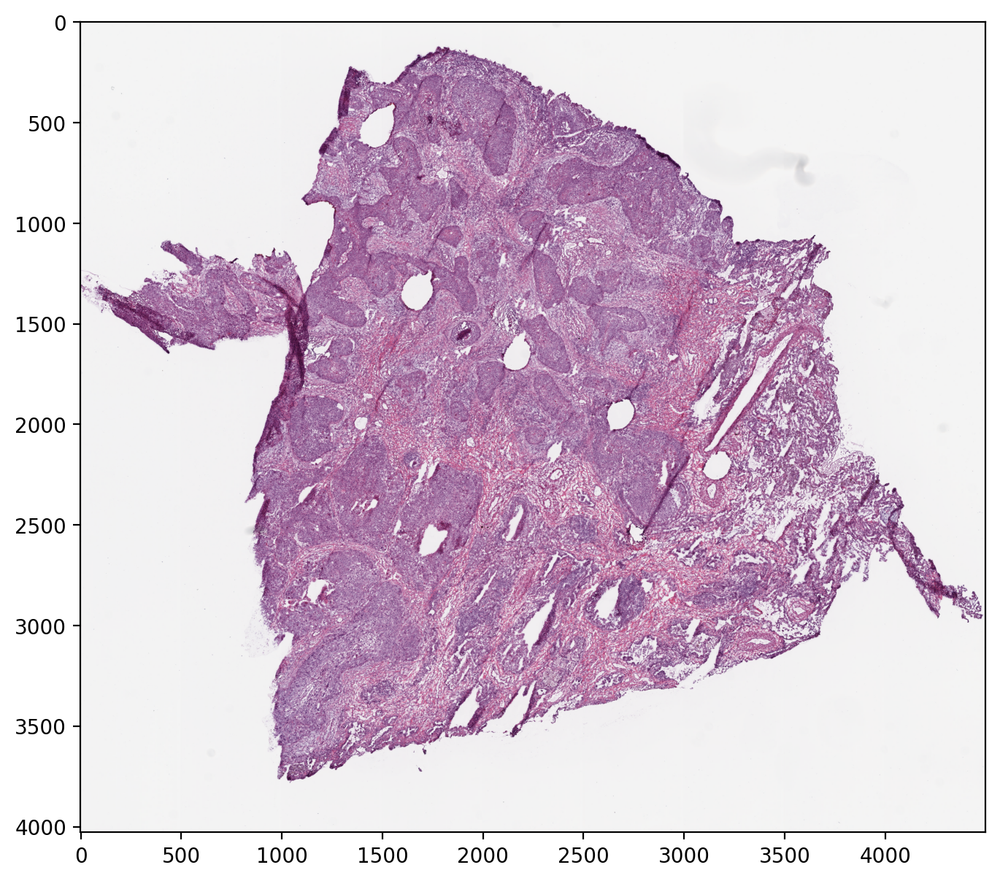

In [ ]:
from PIL import Image
Image.MAX_IMAGE_PIXELS = None
tile_wsi('/content/8be8c3ea-70f6-405f-a52e-e5991a28bd93/TCGA-85-7699-01A-01-TS1.ad1db001-2f9e-4831-a219-f0d5b431206f.svs', '/content/drive/MyDrive/Colab Notebooks (1)/images/tiles/lung_squamous_cell_carcinoma')

In [ ]:
model = keras.models.load_model('/content/retrained80valaccuracymodel.h5')
model = keras.models.load_model('/content/save_at_8 (1).keras')

**exemplary test run of WSI predictions using WSI subtype classification model**

In [ ]:
val_count = 0
for filepath in directory_validation_files_list:
  tile_wsi(filepath,  "/content/drive/My Drive/Colab Notebooks/images/tiles/normal_cells")

print(total_data)

In [ ]:
import os

dir_path = r'/content/drive/MyDrive/Colab Notebooks (1)/images/tiles/lung_squamous_cell_carcinoma'
print(len([entry for entry in os.listdir(dir_path) if os.path.isfile(os.path.join(dir_path, entry))]))

5257


**Training the whole slide imaging prediction model from the stored WSI tiles
(saved according to subtype)**

In [ ]:
pip install keras_cv

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 606.4/606.4 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 11.8 MB/s eta 0:00:00


In [ ]:
pip install torch

In [ ]:
# importing necessary libraries
%matplotlib inline
%config InlineBackend.figure_format='retina'
import numpy
from collections import OrderedDict
import os
import keras
import time
from google.colab import files
from keras.models import Sequential, Model
from keras.layers import Dense, Dropout, Flatten, Conv2D
from keras.layers import MaxPooling2D, BatchNormalization
from keras.optimizers import SGD
import tensorflow as tf
from keras.applications import MobileNet, VGG16, ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from sklearn.metrics import precision_score, recall_score, accuracy_score
from sklearn.metrics import classification_report ,confusion_matrix
from keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import seaborn as sns
import random
import pandas
import keras
import torch
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
import matplotlib.pyplot as plt
from google.colab import drive
import torch

drive.mount('/content/drive', force_remount=True)


data_dir = '/content/drive/MyDrive/Colab Notebooks/images/tiles'

Mounted at /content/drive


In [ ]:
from keras.src.applications import InceptionV3
from tensorflow import keras
from matplotlib import pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from keras.applications import Xception
from keras.applications import DenseNet121
from keras.applications import DenseNet201
from keras.applications import VGG19
from tensorflow.keras.utils import plot_model
from sklearn.utils import class_weight
from keras_cv.layers import RandomColorDegeneration
from imblearn.over_sampling import SMOTE
import numpy as np
sm = SMOTE()

data_augmentation = tf.keras.Sequential([
  # layers.Reshape((224, 224, 3)),
  layers.RandomTranslation((-0.3, 0.3), (-0.3, 0.3)),
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.6),
  RandomColorDegeneration(factor=(0.2, 0.4)),
  layers.RandomContrast(0.75)
])


train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/Colab Notebooks (1)/images/tiles',
    validation_split=0.2,
    labels='inferred',
    color_mode="rgb",
    subset="both",
    seed=1337,
    image_size=(224,224),
    batch_size=128,
    shuffle=True
)

train_class_weights = {0: (5257/2750), 1: 2.5, 2:(5257/772)}
print(train_class_weights)
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

def make_model(input_shape, num_classes):
    inputs = keras.Input(shape=input_shape)

    # return model output
    x = layers.Conv2D(16, 2, activation='relu')(inputs)
    x = layers.MaxPooling2D(2)(x)
    x = layers.Conv2D(32, 2, activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    x = layers.Conv2D(64, 2, activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    x = layers.Conv2D(64, 2, activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    x = layers.GlobalAveragePooling2D()(x)
    predictions = layers.Dense(3, activation='softmax')(x)
    return keras.Model(inputs, outputs=predictions)

model = make_model(input_shape=(224,224,3) , num_classes=3)
keras.utils.plot_model(model, show_shapes=True)
epochs = 10

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
# opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=1e-3), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(
    train_ds,
    validation_data=val_ds,
    class_weight=train_class_weights,
    epochs=epochs,
    callbacks=callbacks,
)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
print("Overall average training accuracy: " + numpy.mean(history.history['accuracy']))
print("Overall average validation accuracy: " + numpy.mean(history.history['validation_accuracy']))

In [ ]:
filepath = "weights.best.hdf5"
checkpoint = ModelCheckpoint(filepath, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max')

# fit the model
model.fit(..., callbacks=[checkpoint])

# load the saved model
model.load_weights("weights.best.hdf5")

In [ ]:
import keras
model.save('trainedmodel.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
from google.colab import files
files.download('/content/trainedmodel.h5') # saving of model weights to local computer

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>



```
# This is formatted as code
```

**Defining model architecture for CT Scan model and training the CT Scan model**

In [ ]:
!pip install keras

In [ ]:
!pip install keras_cv

In [ ]:
! pip install tensorflow --upgrade

In [ ]:
from keras.src.applications import InceptionV3
from tensorflow import keras
import tensorflow as tf
from tensorflow.keras import layers
from keras.applications import Xception
from keras.applications import DenseNet121
from keras.applications import DenseNet201
from keras.applications import VGG19
from tensorflow.keras.utils import plot_model
from sklearn.utils import class_weight

from imblearn.over_sampling import SMOTE
import numpy as np
sm = SMOTE()

data_augmentation = tf.keras.Sequential([
  # layers.Reshape((224, 224, 3)),
  layers.RandomTranslation((-0.3, 0.3), (-0.3, 0.3)),
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.6),
  layers.random_normal_initializer
])


train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/Colab Notebooks/images/tiles',
    validation_split=0.2,
    labels='inferred',
    color_mode="rgb",
    subset="both",
    seed=1337,
    image_size=(224,224),
    batch_size=128,
    shuffle=True
)

train_class_weights = {0: 1.0, 1: (2781/2750), 2:(2781/772)}
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

def make_model(input_shape, num_classes):
    inputs = keras.Input(shape=input_shape)

    base_model = EfficientNetB0(
        include_top=False,
        weights='imagenet',
        input_shape=input_shape
    )

    base_model.trainable = False
    x = base_model(inputs, training=False)

    # return model output
    x = layers.Conv2D(16, 2, activation='relu')(inputs)
    x = layers.MaxPooling2D(2)(x)
    x = layers.Conv2D(32, 2, activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    x = layers.Conv2D(64, 2, activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    x = layers.Conv2D(64, 2, activation='relu')(x)
    x = layers.MaxPooling2D(2)(x)
    x = layers.GlobalAveragePooling2D()(x)
    predictions = Dense(3, activation='softmax')(x)
    return keras.Model(inputs, outputs=predictions)


model = make_model(input_shape=(224,224,3) , num_classes=3)
keras.utils.plot_model(model, show_shapes=True)
epochs = 15

plot_model(model, to_file='model_plot.png', show_shapes=True, show_layer_names=True)
callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
# opt = keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=1e-3), loss='sparse_categorical_crossentropy', metrics=['accuracy'])
history = model.fit(
    train_ds,
    validation_data=val_ds,
    class_weight=train_class_weights,
    epochs=epochs,
    callbacks=callbacks,
)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()
print("Overall average training accuracy: " + numpy.mean(history.history['accuracy']))
print("Overall average validation accuracy: " + numpy.mean(history.history['validation_accuracy']))

In [ ]:
import keras, torch
import PIL
import tensorflow as tf
from PIL import Image
import numpy as np
import os
from tensorflow.keras import layers
from keras_cv.layers import RandomColorDegeneration
from pathlib import Path
model_1 = keras.models.load_model('/content/retrained92valaccuracymodel.h5')

directory ='/content/drive/MyDrive/Colab Notebooks/images/validation_tiles/lung_adenocarcinoma'
model_1_count = 0
total_count = 0

# iterate over files in
# that directory
data_augmentation = tf.keras.Sequential([
  layers.Reshape((224, 224, 3)),
  layers.RandomTranslation((-0.3, 0.3), (-0.3, 0.3)),
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.6)
])

images = Path(directory).glob('*.png')
for file in images:
     print(str(file))
     im = Image.open(str(file))

     # convert the augmented image array back to an image object
     for i in range(4):
      temp_tile_RGB = im.convert('RGB')
      temp_tile_RGB = temp_tile_RGB.rotate(i*90)
      temp_tile_np_as_array = np.asarray(temp_tile_RGB)
      resize = np.resize(temp_tile_np_as_array, (1,224,224,3))
      augmented_img_array = data_augmentation(resize)
      resized = np.resize(augmented_img_array, (1,224,224,3))
      predictions_1 = model_1.predict(resized)
      print(predictions_1)
      max_prediction_1 = np.argmax(predictions_1[0])

      total_count+=1
      if max_prediction_1 == 0:
          model_1_count+=1
          print(str(predictions_1))
          print("accuracy 1 : " + str(model_1_count/total_count))

print("final accuracy 1 : " + str(model_1_count/total_count))

Streaming output truncated to the last 5000 lines.
/content/drive/MyDrive/Colab Notebooks/images/validation_tiles/lung_adenocarcinoma/5_5.png
1/1 [==============================] - 0s 50ms/step
[[9.9998188e-01 9.4292572e-15 1.8073335e-05]]
[[9.9998188e-01 9.4292572e-15 1.8073335e-05]]
accuracy 1 : 0.7745664739884393
1/1 [==============================] - 0s 57ms/step
[[9.9988306e-01 7.5302447e-12 1.1691500e-04]]
[[9.9988306e-01 7.5302447e-12 1.1691500e-04]]
accuracy 1 : 0.7758620689655172
1/1 [==============================] - 0s 49ms/step
[[9.9998343e-01 2.5076105e-13 1.6541579e-05]]
[[9.9998343e-01 2.5076105e-13 1.6541579e-05]]
accuracy 1 : 0.7771428571428571
1/1 [==============================] - 0s 48ms/step
[[9.9945134e-01 4.8105722e-16 5.4862065e-04]]
[[9.9945134e-01 4.8105722e-16 5.4862065e-04]]
accuracy 1 : 0.7784090909090909
/content/drive/MyDrive/Colab Notebooks/images/validation_tiles/lung_adenocarcinoma/6_5.png
1/1 [==============================] - 0s 50ms/step
[[9.9866343

**Creating a custom dataset to pair CT scans and Whole Slide Images based on subtype due to a lack of publicly available paired data**

In [ ]:
import os
import keras
import numpy as np
import nibabel as nib
import pandas as pd

class DataGenerator(keras.utils.Sequence):
    def __init__(self, wsi_paths, ct_scan_dir, batch_size=32):
        self.wsi_paths = wsi_paths
        self.ct_scan_dir = ct_scan_dir
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.wsi_paths) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_wsi_paths = self.wsi_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_ct_scan_images = []
        batch_subtypes = []
        for wsi_path in batch_wsi_paths:
            # Extract subtype from WSI path
            subtype = os.path.splitext(os.path.basename(wsi_path))[0]
            # Load CT scan image with matching subtype
            ct_scan_path = os.path.join(self.ct_scan_dir, subtype, f"{subtype}.nii.gz")
            ct_scan_image = nib.load(ct_scan_path).get_fdata()
            batch_ct_scan_images.append(ct_scan_image)
            batch_subtypes.append(subtype)
        # Load WSI slide data
        wsi_data = []
        for wsi_path in batch_wsi_paths:
            wsi_predictions =  wsi_predictions(wsi_path)
            wsi_data.append([1, 2, 3])
        return [np.array(wsi_data), np.array(batch_ct_scan_images)], pd.get_dummies(batch_subtypes)


wsi_paths = ['path/to/wsi1.gz', 'path/to/wsi2.gz', 'path/to/wsi3.gz']


ct_scan_dir = 'path/to/ct_scan_dir'

data_generator = DataGenerator(wsi_paths, ct_scan_dir, batch_size=32)


In [ ]:
import keras
checkpoint_filepath = '/content/save_at_13.keras'
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

# model is saved at the end of every epoch if it's the best seen so far.
model.fit(epochs=15, callbacks=[model_checkpoint_callback])

# The model (that are considered the best) can be loaded as -
model = keras.models.load_model(checkpoint_filepath)

**Cell for additional training of model**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers
from keras_cv.layers import RandomColorDegeneration

train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    '/content/drive/MyDrive/Colab Notebooks/images/tiles',
    validation_split=0.2,
    labels='inferred',
    color_mode="rgb",
    subset="both",
    seed=1337,
    image_size=(224,224),
    batch_size=128,
    shuffle=True
)

data_augmentation = tf.keras.Sequential([
  # layers.Reshape((224, 224, 3)),
  layers.RandomTranslation((-0.3, 0.3), (-0.3, 0.3)),
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.6),
  RandomColorDegeneration(factor=(0.2, 0.4))
])

train_class_weights = {0: 1.0, 1: (2781/2750), 2:(2781/772)}

train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

# Load the model
model = tf.keras.models.load_model('save_at_13.keras')

# Train the model for additional epochs
model.fit(train_ds, epochs=10, validation_data=val_ds, class_weight=train_class_weights)

# Save the model with the highest validation accuracy
model.save('retrainedwsipatchmodel.h5')

Using TensorFlow backend
Found 6303 files belonging to 3 classes.
Using 5043 files for training.
Using 1260 files for validation.
Epoch 1/10
40/40 [==============================] - 999s 19s/step - loss: 0.5644 - accuracy: 0.8656 - val_loss: 0.8665 - val_accuracy: 0.7579
Epoch 2/10
40/40 [==============================] - 352s 8s/step - loss: 0.3900 - accuracy: 0.8963 - val_loss: 0.7046 - val_accuracy: 0.8373
Epoch 3/10
40/40 [==============================] - 356s 9s/step - loss: 0.3748 - accuracy: 0.9018 - val_loss: 0.2860 - val_accuracy: 0.9206
Epoch 4/10
40/40 [==============================] - 350s 8s/step - loss: 0.3495 - accuracy: 0.9070 - val_loss: 4.7385 - val_accuracy: 0.4873
Epoch 5/10
40/40 [==============================] - 352s 8s/step - loss: 0.5721 - accuracy: 0.8451 - val_loss: 0.4779 - val_accuracy: 0.8690
Epoch 6/10
40/40 [==============================] - 355s 9s/step - loss: 0.3650 - accuracy: 0.8997 - val_loss: 0.6670 - val_accuracy: 0.8310
Epoch 7/10
40/40 [=====

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
pip install torch

**Defining the function for tiling a whole slide image from a patient, using the WSI subtype diagnosis model to generate patch-level predictions. The patch-level predictions will then be aggregated into one final slide-level predictions and used to generate a diagnostic heat map.**


In [ ]:
wsi_predictions_total = []
all_predictions = []
# https://youtu.be/QntLBvUZR5c --> credit
"""
OpenSlide can read virtual slides in several formats:

Aperio (.svs, .tif)
Hamamatsu (.ndpi, .vms, .vmu)
Leica (.scn)
MIRAX (.mrxs)
Philips (.tiff)
Sakura (.svslide)
Trestle (.tif)
Ventana (.bif, .tif)
Generic tiled TIFF (.tif)

OpenSlide allows reading a small amount of image data at the resolution
closest to a desired zoom level.f

pip install openslide-python

then download the latest windows binaries
https://openslide.org/download/

Extract the contents to a place that you can locate later.

If you are getting the error: [WinError 126] The specified module could not be found

Open the lowlevel.py file located in:
    lib\site-packages\openslide

Add this at the top, after from __future__ import division, in the lowlevel.py
os.environ['PATH'] = "path+to+binary" + ";" + os.environ['PATH']
path+to+binary is the path to your windows binaries that you just downloaded.

In my case, it looks like this.

import os
os.environ['PATH'] = "C:/Users/Admin/anaconda3/envs/py37/lib/site-packages/openslide/openslide-win64-20171122/bin" + ";" + os.environ['PATH']

A few useful commands to locate the sitepackages directory

import sys
for p in sys.path:
    print(p)


"""

#import pyvips
from openslide import open_slide
from openslide.deepzoom import DeepZoomGenerator
import openslide
import PIL
from keras.preprocessing import image
from google.colab import files as FILE
import cv2
from PIL import Image
import tensorflow as tf
# from keras_cv.layers import RandomColorDegeneration
import numpy
from keras.utils import to_categorical
import numpy as np
from matplotlib import pyplot as plt
from keras import layers
PIL.Image.MAX_IMAGE_PIXELS = 2767605120
total_data = []


def mask_color_img(img, mask, color=[0, 255, 255], alpha=0.3):
    '''
    img: cv2 image
    mask: bool or np.where
    color: BGR triplet [_, _, _]. Default: [0, 255, 255] is yellow.
    alpha: float [0, 1].

    Ref: http://www.pyimagesearch.com/2016/03/07/transparent-overlays-with-opencv/
    '''
    out = img.copy()
    img_layer = img.copy()
    img_layer[mask] = color
    out = cv2.addWeighted(img_layer, alpha, out, 1 - alpha, 0, out)
    return(out)

def wsi_predictions(filepath):
  colored_patch_count = 0
  global  all_predictions
  global wsi_predictions_total
  threshold_predictions = []
  threshold_predictions_details = []
  #Load the slide file (svs) into an object.
  slide = open_slide(filepath)
  # image = Image.open(filepath)
  # rgb = np.asarray(image)
  # print("SHAPE: " + str(rgb.shape))

  slide_props = slide.properties
  print(slide_props)

  print("Vendor is:", slide_props['openslide.vendor'])
  print("Pixel size of X in um is:", slide_props['openslide.mpp-x'])
  print("Pixel size of Y in um is:", slide_props['openslide.mpp-y'])

  #Objective used to capture the image
  objective = float(slide.properties[openslide.PROPERTY_NAME_OBJECTIVE_POWER])
  print("The objective power is: ", objective)

  # get slide dimensions for the level 0 - max resolution level
  slide_dims = slide.dimensions
  print(slide_dims)

  #Get a thumbnail of the image and visualize
  slide_thumb_600 = slide.get_thumbnail(size=(600, 600))
  slide_thumb_600.show()

  #Convert thumbnail to numpy array
  slide_thumb_600_np = np.array(slide_thumb_600)
  plt.figure(figsize=(8,8))
  plt.imshow(slide_thumb_600_np)


  #Get slide dims at each level. Remember that whole slide images store information
  #as pyramid at various levels
  dims = slide.level_dimensions

  num_levels = len(dims)
  print("Number of levels in this image are:", num_levels)

  print("Dimensions of various levels in this image are:", dims)

  #By how much are levels downsampled from the original image?
  factors = slide.level_downsamples
  print("Each level is downsampled by an amount of: ", factors)

  #Copy an image from a level
  level3_dim = dims[1]

  #Return the best level for displaying the given downsample.
  SCALE_FACTOR = 32
  best_level = slide.get_best_level_for_downsample(SCALE_FACTOR)
  #Here it returns the best level to be 2 (third level)
  #If you change the scale factor to 2, it will suggest the best level to be 0 (our 1st level)
  #################################

  #Generating tiles for deep learning training or other processing purposes
  #We can use read_region function and slide over the large image to extract tiles
  #but an easier approach would be to use DeepZoom based generator.
  # https://openslide.org/api/python/

  #Generate object for tiles using the DeepZoomGenerator
  tiles = DeepZoomGenerator(slide, tile_size=224, overlap=0, limit_bounds=False)
  #Here, we have divided our svs into tiles of size 256 with no overlap.
  #The tiles object also contains data at many levels.
  #To check the number of levels
  print("The number of levels in the tiles object are: ", tiles.level_count)

  print("The tile level count is: ", tiles.level_tiles)
  print("The dimensions of data in each level are: ", tiles.level_dimensions)

  #Total number of tiles in the tiles object
  print("Total number of tiles = : ", tiles.tile_count)

  #How many tiles at a specific level?
  level_num = 14
  print("Tiles shape at level ", level_num, " is: ", tiles.level_tiles[level_num])
  print("This means there are ", tiles.level_tiles[level_num][0]*tiles.level_tiles[level_num][1], " total tiles in this level")

  #Dimensions of the tile (tile size) for a specific tile from a specific layer
  tile_dims = tiles.get_tile_dimensions(3, (0,0)) #Provide deep zoom level and address (column, row)
  print("tile dims: " + str(tile_dims))

  #Tile count at the highest resolution level (level 16 in our tiles)
  tile_count_in_large_image = tiles.level_tiles[1] #126 x 151 (32001/256 = 126 with no overlap pixels)
  print("count: " + str(tile_count_in_large_image))


  single_tile = tiles.get_tile(5, (0, 0)) #Provide deep zoom level and address (column, row)
  single_tile_RGB = single_tile.convert('RGB')
  single_tile_RGB.show()

  ###### Saving each tile to local directory
  cols, rows = tiles.level_tiles[14]

  import os
  count = 0
  tiles_rep = numpy.empty((cols, rows, 3))                      # allocate, but don't initialize
  lung_adenocarcinoma_prediction = 0.0
  lung_squamous_cell_carcinoma_prediction = 0.0
  normal_cell_prediction = 0.0
  if not os.path.exists('/content/' + filepath.split('/')[-1]):
    os.makedirs('/content/' + filepath.split('/')[-1])
  for row in range(rows):
      for col in range(cols):
          tile_name = '%s_%d_%d.png' % ("tcga_whole_slide_image", col, row)
          temp_tile = tiles.get_tile(14, (col, row))

          pixels = temp_tile.getdata() # get the pixels as a flattened sequence
          white_thresh = 255
          nwhite = 0
          for pixel in pixels:
              if 600 < sum(pixel) < 765:
                  nwhite += 1
          n = len(pixels)

          if (nwhite / float(n)) < 0.8:
              temp_tile_RGB = temp_tile.convert('RGB')
              resize = numpy.resize(temp_tile_RGB, (1,224,224,3))
              resize = np.asarray(resize)
              #resize = np.resize(temp_tile_np_as_array, (1,224,224,3))
              og_predictions = model.predict(resize)
              final_predictions = og_predictions[0]
              for i in range(3):
                temp_tile_RGB = temp_tile.convert('RGB').rotate((i+1)*90)
                temp_tile_RGB = np.resize(temp_tile_RGB,(1,224,224,3)
                temp_tile_np = np.asarray(temp_tile_RGB)
                resized = numpy.resize(temp_tile_RGB, (1, 224,224,3))
                predictions = model.predict(resized)
                print(predictions)
                final_predictions[0] += predictions[0][0]
                final_predictions[1] += predictions[0][1]
                final_predictions[2] += predictions[0][2]

              final_predictions = [x/4 for x in final_predictions]
              tiles_rep[col][row] = final_predictions
              lung_adenocarcinoma_prediction += final_predictions[0]
              lung_squamous_cell_carcinoma_prediction += final_predictions[1]
              normal_cell_prediction += final_predictions[2]
              max_prediction = np.argmax(final_predictions)

              final_percentage = int(float(final_predictions[max_prediction]) * 100)
              if final_percentage >= 90:
                threshold_predictions.append(max_prediction)
                threshold_predictions_details.append(final_predictions)

              classes = ['lung_adenocarcinoma', 'lung_squamous_cell_carcinoma', 'normal_cells']
              print("PREDICTION: " + str(classes[max_prediction]) + " WITH PERCENTAGE OF " + str(final_percentage))
              temp_tile_RGB = temp_tile.convert('RGB')
              color = Image.new('RGB', temp_tile_RGB.size,(int(255*(final_percentage/100)),0,0))
              if max_prediction == 1:
                color = Image.new('RGB', temp_tile_RGB.size,(0,int(255*(final_percentage/100)),0))
              if max_prediction == 2:
                  color = Image.new('RGB', temp_tile_RGB.size,(0,0,int(255*(final_percentage/100))))

              mask = Image.new('RGBA',temp_tile_RGB.size,(0,0,0,123))

              colored_version = Image.composite(temp_tile_RGB,color,mask).convert('RGB')
              colored_version.save(('/content/' + filepath.split('/')[-1] + '/%s') % (tile_name))
              count = count + 1
              colored_patch_count += 1

          else:
              temp_tile_RGB = temp_tile.convert('RGB')
              temp_tile_RGB.save(('/content/' + filepath.split('/')[-1] + '/%s') % (tile_name))

  if count != 0:
    print("FINAL ADENOCARCINOMA PREDICTION: " + str(lung_adenocarcinoma_prediction/count))
    print("FINAL SQUAMOUS CELL CARCINOMA PREDICTION: " + str(lung_squamous_cell_carcinoma_prediction/count))
    print("FINAL NORMALL CELLS PREDICTION: " + str(normal_cell_prediction/count))

  average = [0.0, 0.0, 0.0]
  total = 0
  for elem in threshold_predictions_details:
    average[0] += elem[0]
    average[1] += elem[1]
    average[2] += elem[2]
    total +=1

  non_treshold_average = [lung_adenocarcinoma_prediction/count, lung_squamous_cell_carcinoma_prediction/count, normal_cell_prediction/count]
  merge_images('/content/' + filepath.split('/')[-1], ('merged_'+filepath.split('/')[-1]+'.jpg'))
  FILE.download('/content/'+('merged_'+filepath.split('/')[-1]+'.jpg'))
  wsi_predictions_total.append([lung_adenocarcinoma_prediction/count, lung_squamous_cell_carcinoma_prediction/count, normal_cell_prediction/count])
  if total != 0:
    average = [x/total for x in average]
    all_predictions.append(average)
    return average
  else:
    wsi_predictions_total.append(non_treshold_average)
    return non_treshold_average

def imshow(image, ax=None, title=None):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()

    # Undo preprocessing
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean

    # image needs to be clipped between 0 and 1 or it looks like noise when displayed
    image = np.clip(image, 0, 1)

    ax.imshow(image)

    return ax

In [ ]:
model.save('/content/save_at_14.keras')

In [ ]:
merge_images('/content/TCGA-73-4659-01A-01-BS1.b06128bd-9e18-4a74-9b61-ec3d592fe5b2.svs', 'image.png')

Merged, resized, and clearer image saved as final_image.png


**Running tiling and patch-level predictions for all the whole slide imaging .svs files stored across patients**

In [ ]:
wsi_predictions('/content/0fa61cf5-620d-4eed-8289-a773702795c3/TCGA-63-6202-01A-01-TS1.dee1467a-8fee-47b5-88b2-6b0c599cc57d.svs')

In [ ]:
wsi_predictions('/content/f3ab8928-43ef-4547-ba15-7c99c8575f73/TCGA-34-2596-01A-01-BS1.97310b4d-968a-4ade-b9f0-16f833a1698d.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '02/22/13', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-44-2666-11A-02-TS2', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '124881', 'aperio.Left': '33.663380', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '0.001550', 'aperio.MPP': '0.5040', 'aperio.OriginalHeight': '14960', 'aperio.OriginalWidth': '50000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1248CNTLR', 'aperio.StripeWidth': '1000', 'aperio.Time': '08:12:23', 'aperio.Time Zone': 'GMT-05:00', 'aperio.Title': 'TCGA-44-2666-11A-02-TS2', 'aperio.Top': '15.728780', 'aperio.User': 'c82321af-a56f-4728-9561-09ef9c7b64eb', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n50000x14960 [0,0 47718x14860] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth = 

[0.003007589393980974, 0.16751682259797307, 0.8294755869497688]

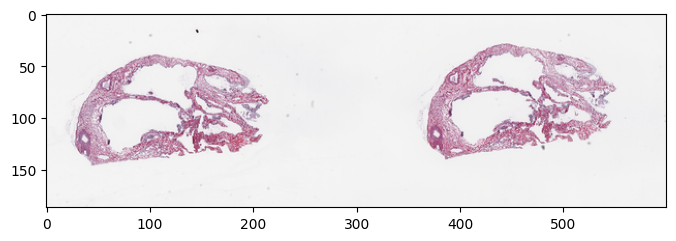

In [ ]:
wsi_predictions('21235b67-ac53-4894-a02a-3198ee49821a/TCGA-44-2666-11A-03-TS3.65EDB2DC-8D45-443D-81D2-A69AD8DDDA32.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '02/25/13', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-44-6147-11A-04-TS4', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '125069', 'aperio.Left': '28.079353', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '0.001550', 'aperio.MPP': '0.5040', 'aperio.OriginalHeight': '18363', 'aperio.OriginalWidth': '44000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1248CNTLR', 'aperio.StripeWidth': '1000', 'aperio.Time': '15:05:45', 'aperio.Time Zone': 'GMT-05:00', 'aperio.Title': 'TCGA-44-6147-11A-04-TS4', 'aperio.Top': '17.424812', 'aperio.User': '753f0499-ddf0-4dc3-be72-1439f640a913', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n44000x18363 [0,0 41992x18263] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth = 

[7.800274004642374e-05, 0.6382160570895816, 0.3617059537076524]

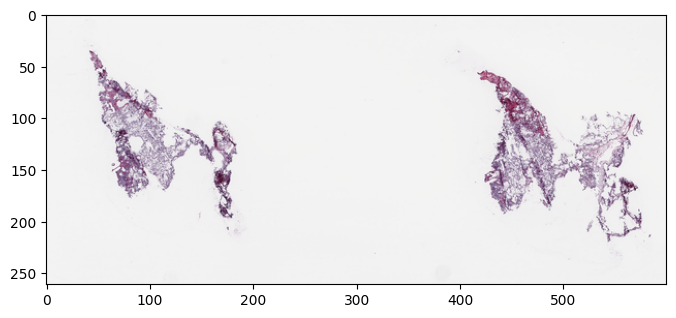

In [ ]:
wsi_predictions('0dea7bf0-721e-4fb9-beef-3024093ec1b1/TCGA-44-6147-11A-05-TS5.41088AE2-F335-4BA2-B096-F9135208100D.svs')

Streaming output truncated to the last 5000 lines.
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (224, 224, 3)
1/1 [==============================] - 0s 45ms/step
[[1.3144395e-10 9.9999702e-01 3.0394276e-06]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (224, 224, 3)
1/1 [==============================] - 0s 47ms/step
[[6.6228384e-10 9.9999952e-01 4.4168792e-07]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (224, 224, 3)
1/1 [==============================] - 0s 59ms/step
[[1.874004e-09 9.999902e-01 9.744327e-06]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (224, 224, 3)
1/1 [==============================] - 0s 71ms/step
[[1.0533269e-08 9.9986231e-01 1.3767117e-04]]
PREDICTION: lung_squamous_cell_carcinoma WITH PERCENTAGE OF 99
1/1 [==============================] - 0s 44ms/step
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (224, 224, 3)
1/1 [==============================] - 0s 60ms/step
[[1.1684527e-10 1.0000000e+00 3.4843623e-08]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (224, 224, 3)
1/1 [==================

[0.0097826717356017, 0.9668137965549247, 0.023403539957207765]

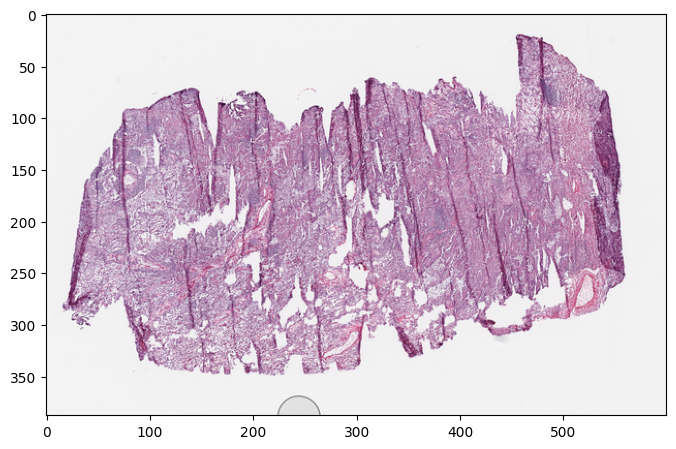

In [ ]:
wsi_predictions('e2053840-4d14-4e2a-b53f-9935efe0e67f/TCGA-55-8619-01A-01-TS1.0dc030d8-c16e-4d3b-8bae-9f8ec5ab8962.svs')

Streaming output truncated to the last 5000 lines.
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 21ms/step
[[8.6386198e-01 2.9634556e-04 1.3584162e-01]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 30ms/step
[[0.31787392 0.00137917 0.68074685]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 27ms/step
[[0.21978319 0.3444306  0.4357862 ]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 23ms/step
[[2.6253841e-03 4.3977834e-05 9.9733067e-01]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 65
1/1 [==============================] - 0s 23ms/step
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 22ms/step
[[0.05694015 0.69147134 0.2515885 ]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] -

[0.39037215234391764, 0.2956641433564156, 0.31396370272867513]

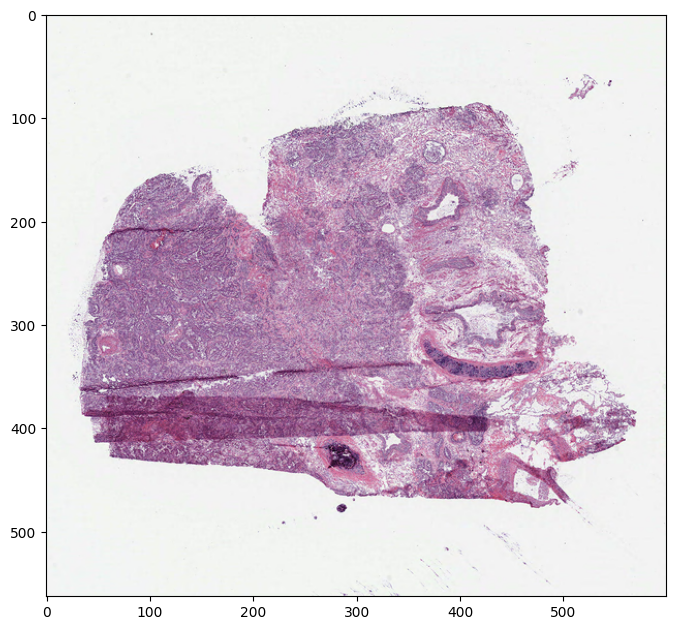

In [ ]:
wsi_predictions('f22c1871-b40b-4c9f-9388-b5bc5fbbad87/TCGA-44-6147-01A-01-BS1.cfa99719-2df2-4b32-be20-2c96483727cb.svs')

Streaming output truncated to the last 5000 lines.
[[0.6781789 0.2757614 0.0460597]]
1/1 [==============================] - 0s 35ms/step
[[0.74794173 0.219589   0.03246925]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 70
1/1 [==============================] - 0s 27ms/step
[[0.7340796  0.22600333 0.03991707]]
1/1 [==============================] - 0s 33ms/step
[[0.7609716  0.20719282 0.03183554]]
1/1 [==============================] - 0s 34ms/step
[[0.6990062  0.26785684 0.03313696]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 73
1/1 [==============================] - 0s 28ms/step
[[0.78297913 0.18811513 0.02890577]]
1/1 [==============================] - 0s 35ms/step
[[0.78658086 0.18847497 0.02494419]]
1/1 [==============================] - 0s 35ms/step
[[0.73856175 0.2277951  0.03364313]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 77
1/1 [==============================] - 0s 27ms/step
[[0.65393883 0.3063899  0.03967132]]
1/1 [==============================] - 0s

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

NameError: name 'wsi_predictions_total' is not defined

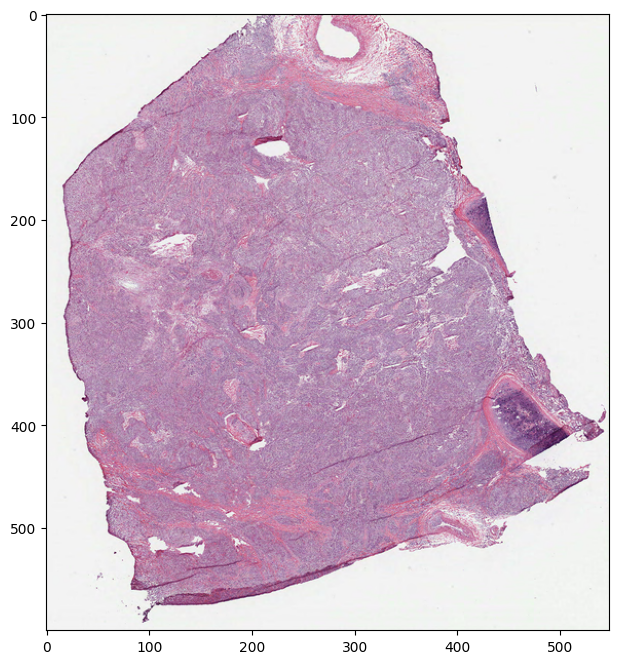

In [ ]:
wsi_predictions('8be8c3ea-70f6-405f-a52e-e5991a28bd93/TCGA-85-7699-01A-01-TS1.ad1db001-2f9e-4831-a219-f0d5b431206f.svs')

Streaming output truncated to the last 5000 lines.
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 37ms/step
[[0.00850998 0.0207979  0.97069216]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 36ms/step
[[0.00451874 0.00448393 0.9909973 ]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 43ms/step
[[0.03717095 0.01902015 0.943809  ]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 39ms/step
[[0.01757043 0.00718415 0.9752455 ]]
PREDICTION: normal_cells WITH PERCENTAGE OF 81
1/1 [==============================] - 0s 34ms/step
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 38ms/step
[[0.00108088 0.00168563 0.99723345]]
ORIGINAL SIZE: (224, 224)
ASARRAY SIZE: (1, 224, 224, 3)
1/1 [==============================] - 0s 37ms/step
[[0.0221589

[0.22937505336199313, 0.1345621128217021, 0.6360628344402969]

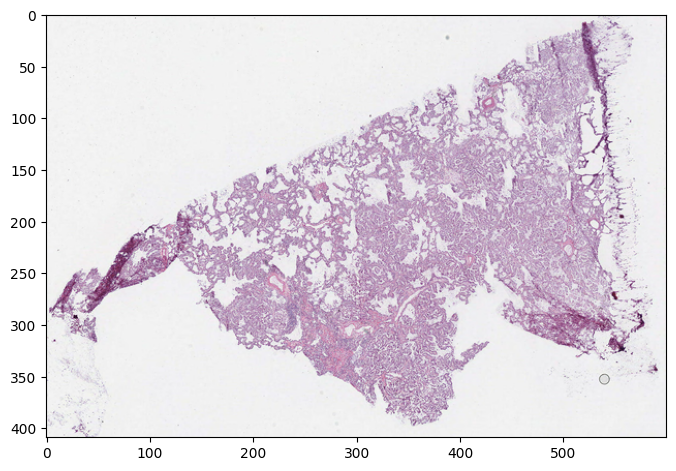

In [ ]:
wsi_predictions('71673a51-aa04-4d28-913a-50ee9ecc419e/TCGA-44-6776-01A-01-BS1.7b26c23b-edbf-4de8-8add-37544a4e74ed.svs')

In [ ]:
wsi_predictions('6a2b48f0-a8db-452a-b6e7-4eb343760fe8/TCGA-NC-A5HO-01A-01-TS1.62FF3313-6DFC-4F64-9E69-9D1C852A57D4.svs')

In [ ]:
wsi_predictions('e7f98887-a7ae-4fd4-abd7-b9fb93e9f154/TCGA-73-4659-01A-01-BS1.b06128bd-9e18-4a74-9b61-ec3d592fe5b2.svs')

In [ ]:
wsi_predictions('3be427e3-096b-4199-b4c7-3ee1b5d73882/TCGA-44-6147-01B-05-BS5.B838E2DC-8869-4C72-9F1D-A066FF307579.svs')

Streaming output truncated to the last 5000 lines.
[[0.13993575 0.84938425 0.01068002]]
1/1 [==============================] - 0s 31ms/step
[[0.13212563 0.865036   0.00283839]]
PREDICTION: lung_squamous_cell_carcinoma WITH PERCENTAGE OF 87
1/1 [==============================] - 0s 34ms/step
[[0.1161626 0.8656346 0.0182028]]
1/1 [==============================] - 0s 32ms/step
[[0.7451144  0.02909055 0.22579509]]
1/1 [==============================] - 0s 35ms/step
[[0.2005861  0.7809048  0.01850903]]
PREDICTION: lung_squamous_cell_carcinoma WITH PERCENTAGE OF 52
1/1 [==============================] - 0s 33ms/step
[[0.24553683 0.50417525 0.25028795]]
1/1 [==============================] - 0s 34ms/step
[[0.09310493 0.88765126 0.0192438 ]]
1/1 [==============================] - 0s 54ms/step
[[0.30167174 0.51241857 0.18590966]]
PREDICTION: lung_squamous_cell_carcinoma WITH PERCENTAGE OF 65
1/1 [==============================] - 0s 49ms/step
[[5.4444816e-02 9.4507653e-01 4.7869733e-04]]
1/1 [

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[86.47387759818876, 666.1862143824068, 5.339908825476298]

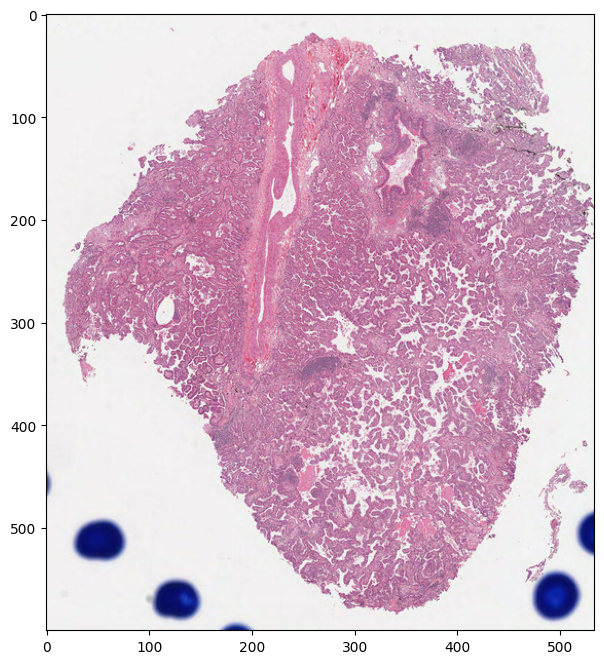

In [ ]:
wsi_predictions('490fc336-7208-41c6-9eb8-215865c9f634/TCGA-78-7537-01A-01-TS1.4571601f-a256-4394-b5d1-60e22115072b.svs')

In [ ]:
wsi_predictions('490fc336-7208-41c6-9eb8-215865c9f634/TCGA-78-7537-01A-01-TS1.4571601f-a256-4394-b5d1-60e22115072b.svs')

Streaming output truncated to the last 5000 lines.
[[0.49198142 0.12676148 0.38125703]]
1/1 [==============================] - 0s 55ms/step
[[0.94955045 0.01067358 0.03977593]]
1/1 [==============================] - 0s 48ms/step
[[0.50995475 0.19311343 0.29693183]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 69
1/1 [==============================] - 0s 51ms/step
[[0.9611824  0.00214898 0.03666861]]
1/1 [==============================] - 0s 53ms/step
[[0.84338105 0.01392169 0.1426972 ]]
1/1 [==============================] - 0s 57ms/step
[[0.762686   0.01667093 0.22064304]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 79
1/1 [==============================] - 0s 68ms/step
[[0.53945357 0.21515675 0.24538967]]
1/1 [==============================] - 0s 52ms/step
[[0.9777525  0.01749742 0.00475007]]
1/1 [==============================] - 0s 45ms/step
[[0.7259283  0.06044014 0.2136316 ]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 75
1/1 [==============================] -

In [ ]:
wsi_predictions('02e3368d-afb5-4f9f-8d6c-e512c2ba435b/771e6d5d-c6f8-4b1e-a17f-3a82e4293cff.mirbase21.mirnas.quantification.txt')

In [ ]:
wsi_predictions('78b1b726-88a9-44da-b074-897a8043a6b4/TCGA-J2-A4AD-01Z-00-DX1.C3C3B0C6-0666-4CCF-8422-345560B237DA.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': '10.55.211.32', 'aperio.Date': '09/08/10', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': '20489', 'aperio.Focus Offset': '-0.000500', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '20489', 'aperio.Left': '30.475840', 'aperio.LineAreaXOffset': '0.021368', 'aperio.LineAreaYOffset': '-0.005374', 'aperio.LineCameraSkew': '-0.000389', 'aperio.MPP': '0.5015', 'aperio.OriginalHeight': '22584', 'aperio.OriginalWidth': '20400', 'aperio.ScanScope ID': 'SS1302', 'aperio.StripeWidth': '2040', 'aperio.Time': '10:16:11', 'aperio.Top': '17.869844', 'aperio.User': '94cd65e9-dc05-463d-929e-61da5ff23571', 'openslide.comment': 'Aperio Image Library v10.2.20\r\n20400x22584 [0,100 20000x22484] (256x256) JPEG/RGB Q=70|AppMag = 20|StripeWidth = 2040|ScanScope ID = SS1302|Filename = 20489|Date = 09/08/10|Time = 10:16:11|User = 94cd65e9-dc05-463d-929e-61da5ff23571|MPP = 0.5015|L

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[127.78602435509674, 3.194280373051697, 18.019695486524142]

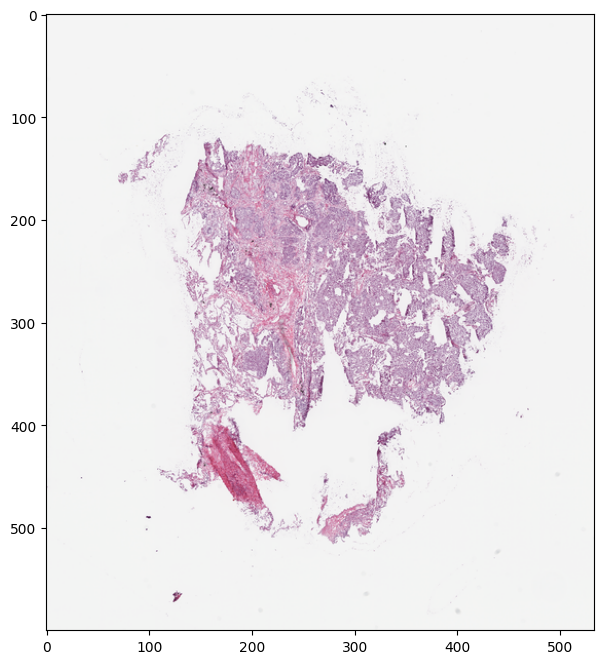

In [ ]:
wsi_predictions('/content/a6f50c04-3fa3-4fc3-8707-a793788906b9/TCGA-50-5072-01A-02-BS2.37dae380-2992-4773-8396-73ee1fc59547.svs')

<_PropertyMap {'aperio.AppMag': '40', 'aperio.DSR ID': 'ap1546-dsr', 'aperio.Date': '02/03/11', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': '23654', 'aperio.Focus Offset': '0.000000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '23654', 'aperio.Left': '30.925198', 'aperio.LineAreaXOffset': '0.004954', 'aperio.LineAreaYOffset': '-0.003469', 'aperio.LineCameraSkew': '0.000963', 'aperio.MPP': '0.2462', 'aperio.OriginalHeight': '18454', 'aperio.OriginalWidth': '22816', 'aperio.ScanScope ID': 'SS1546', 'aperio.StripeWidth': '992', 'aperio.Time': '14:36:09', 'aperio.Top': '15.076447', 'aperio.User': '196be706-f9ee-42ad-af71-366c499a599e', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n22816x18454 [0,100 21896x18354] (240x240) J2K/YUV16 Q=70|AppMag = 40|StripeWidth = 992|ScanScope ID = SS1546|Filename = 23654|Date = 02/03/11|Time = 14:36:09|User = 196be706-f9ee-42ad-af71-366c499a599e|MPP = 0.2462|Left =

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[12.023327204864472, 190.92183069884777, 0.05484251723289579]

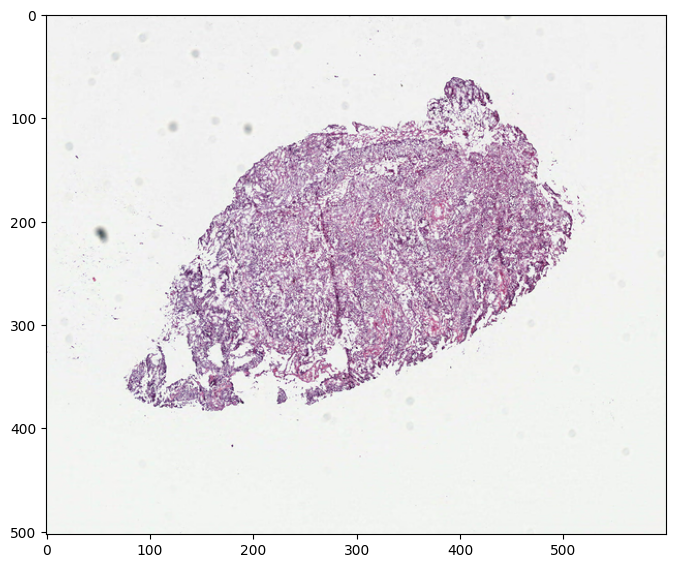

In [ ]:
wsi_predictions('e9258057-af6b-4502-8a2a-f55f8d5fe6e7/TCGA-56-5898-01A-01-TS1.a4de8671-d8c8-473e-a396-003f478f1850.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': '10.55.211.32', 'aperio.Date': '09/08/10', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': '20489', 'aperio.Focus Offset': '-0.000500', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '20489', 'aperio.Left': '30.475840', 'aperio.LineAreaXOffset': '0.021368', 'aperio.LineAreaYOffset': '-0.005374', 'aperio.LineCameraSkew': '-0.000389', 'aperio.MPP': '0.5015', 'aperio.OriginalHeight': '22584', 'aperio.OriginalWidth': '20400', 'aperio.ScanScope ID': 'SS1302', 'aperio.StripeWidth': '2040', 'aperio.Time': '10:16:11', 'aperio.Top': '17.869844', 'aperio.User': '94cd65e9-dc05-463d-929e-61da5ff23571', 'openslide.comment': 'Aperio Image Library v10.2.20\r\n20400x22584 [0,100 20000x22484] (256x256) JPEG/RGB Q=70|AppMag = 20|StripeWidth = 2040|ScanScope ID = SS1302|Filename = 20489|Date = 09/08/10|Time = 10:16:11|User = 94cd65e9-dc05-463d-929e-61da5ff23571|MPP = 0.5015|L

KeyboardInterrupt: ignored

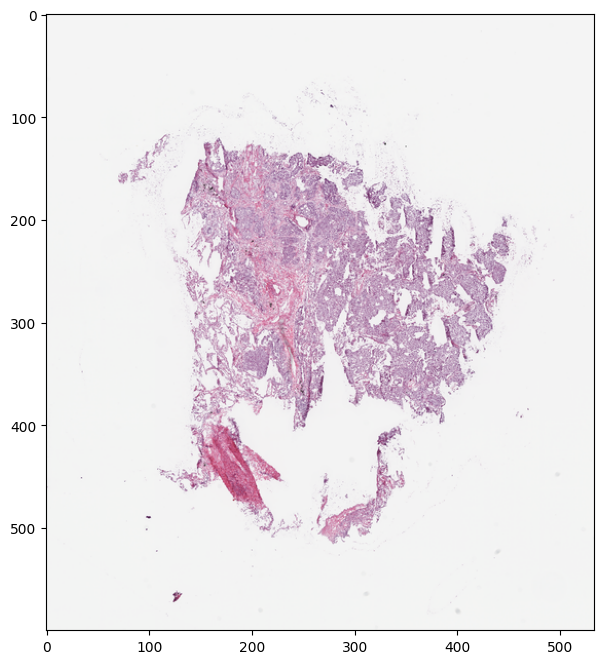

In [ ]:
wsi_predictions('/content/a6f50c04-3fa3-4fc3-8707-a793788906b9/TCGA-50-5072-01A-02-BS2.37dae380-2992-4773-8396-73ee1fc59547.svs')

In [ ]:
wsi_predictions('e2053840-4d14-4e2a-b53f-9935efe0e67f/TCGA-55-8619-01A-01-TS1.0dc030d8-c16e-4d3b-8bae-9f8ec5ab8962.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '03/17/14', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-33-AASL-11A-01-TS1', 'aperio.Focus Offset': '-0.000500', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '153405', 'aperio.Left': '21.587873', 'aperio.LineAreaXOffset': '-0.025663', 'aperio.LineAreaYOffset': '0.001319', 'aperio.LineCameraSkew': '0.000833', 'aperio.MPP': '0.4957', 'aperio.OriginalHeight': '19784', 'aperio.OriginalWidth': '51000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1436CNTLR', 'aperio.StripeWidth': '2040', 'aperio.Time': '09:36:03', 'aperio.Time Zone': 'GMT-04:00', 'aperio.Title': 'TCGA-33-AASL-11A-01-TS1', 'aperio.Top': '16.885508', 'aperio.User': '63686fee-b201-45c3-8835-7650e819dbc4', 'openslide.comment': 'Aperio Image Library vFS90 01\r\n51000x19784 [0,100 50027x19684] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[0.7690580025315285, 0.030586445260060734, 0.20035555383219616]

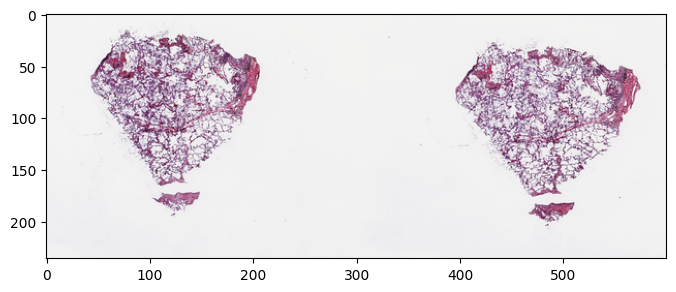

In [ ]:
wsi_predictions('e4285698-28e8-4171-9cb5-b4290e2cd228/TCGA-33-AASL-11A-01-TS1.76BCC6D0-D4E3-4FB6-BC4E-920E16E8D5A5.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '02/14/13', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-44-6146-11A-01-TSA', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '124353', 'aperio.Left': '29.676859', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '0.001550', 'aperio.MPP': '0.5040', 'aperio.OriginalHeight': '12826', 'aperio.OriginalWidth': '49000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1248CNTLR', 'aperio.StripeWidth': '1000', 'aperio.Time': '08:15:02', 'aperio.Time Zone': 'GMT-05:00', 'aperio.Title': 'TCGA-44-6146-11A-01-TSA', 'aperio.Top': '14.516992', 'aperio.User': '37538f4a-e250-4d24-9670-218f13099677', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n49000x12826 [0,0 46763x12726] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth = 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[0.9218866527080536, 1.3757599901964568e-05, 0.07809956651180983]

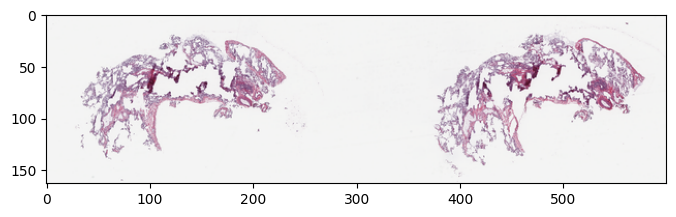

In [ ]:
wsi_predictions('8b7dead4-4a47-4180-87d2-3cb0cfaabea2/TCGA-44-6146-11A-02-TS2.C2102AB4-AA0D-4C49-A61A-DBCF01A8F410.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '02/14/13', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-44-5645-11A-01-TS1', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '124349', 'aperio.Left': '27.531719', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '0.001550', 'aperio.MPP': '0.5040', 'aperio.OriginalHeight': '12085', 'aperio.OriginalWidth': '44000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1248CNTLR', 'aperio.StripeWidth': '1000', 'aperio.Time': '08:11:57', 'aperio.Time Zone': 'GMT-05:00', 'aperio.Title': 'TCGA-44-5645-11A-01-TS1', 'aperio.Top': '12.486637', 'aperio.User': '37538f4a-e250-4d24-9670-218f13099677', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n44000x12085 [0,0 41992x11985] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth = 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[0.9124477207660675, 7.865115549066104e-05, 0.08747364208102226]

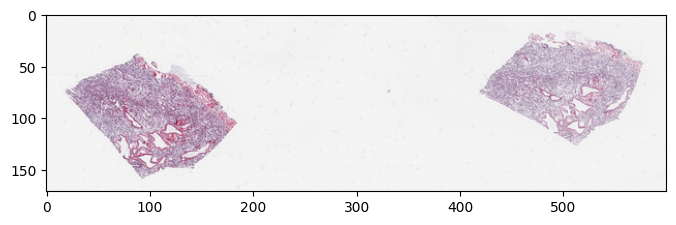

In [ ]:
wsi_predictions('a9856ce3-f297-4635-8e9c-3af03f35b8a0/TCGA-44-5645-11A-02-TS2.F7F3BB9A-F734-4616-A605-560A9A357F9A.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '02/22/13', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-44-2666-11A-02-TS2', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '124881', 'aperio.Left': '33.663380', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '0.001550', 'aperio.MPP': '0.5040', 'aperio.OriginalHeight': '14960', 'aperio.OriginalWidth': '50000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1248CNTLR', 'aperio.StripeWidth': '1000', 'aperio.Time': '08:12:23', 'aperio.Time Zone': 'GMT-05:00', 'aperio.Title': 'TCGA-44-2666-11A-02-TS2', 'aperio.Top': '15.728780', 'aperio.User': 'c82321af-a56f-4728-9561-09ef9c7b64eb', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n50000x14960 [0,0 47718x14860] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth = 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[0.07626258171698515, 0.0017711909374321158, 0.921966221104277]

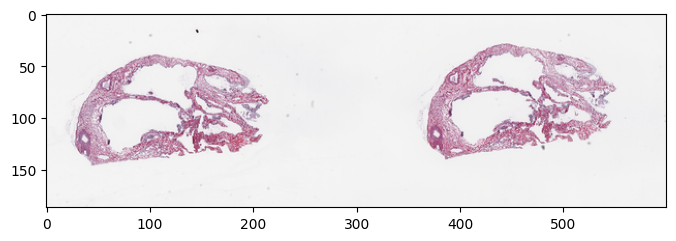

In [ ]:
wsi_predictions('21235b67-ac53-4894-a02a-3198ee49821a/TCGA-44-2666-11A-03-TS3.65EDB2DC-8D45-443D-81D2-A69AD8DDDA32.svs')

Streaming output truncated to the last 5000 lines.
[[0.9846682  0.01423958 0.00109224]]
1/1 [==============================] - 0s 36ms/step
[[9.7729880e-01 2.2018213e-02 6.8292872e-04]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 97
1/1 [==============================] - 0s 33ms/step
[[0.9787877 0.0176247 0.0035876]]
1/1 [==============================] - 0s 39ms/step
[[0.9771235  0.01624886 0.00662772]]
1/1 [==============================] - 0s 40ms/step
[[0.97599244 0.01863867 0.00536901]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 97
1/1 [==============================] - 0s 36ms/step
[[0.9964036  0.00252962 0.0010668 ]]
1/1 [==============================] - 0s 38ms/step
[[9.9505568e-01 4.3215514e-03 6.2273914e-04]]
1/1 [==============================] - 0s 34ms/step
[[0.99332523 0.00496633 0.00170834]]
PREDICTION: lung_adenocarcinoma WITH PERCENTAGE OF 99
1/1 [==============================] - 0s 33ms/step
[[9.9553055e-01 3.6201277e-03 8.4940100e-04]]
1/1 [=========

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[0.922711828154292, 0.07591978304449952, 0.0013683897196255601]

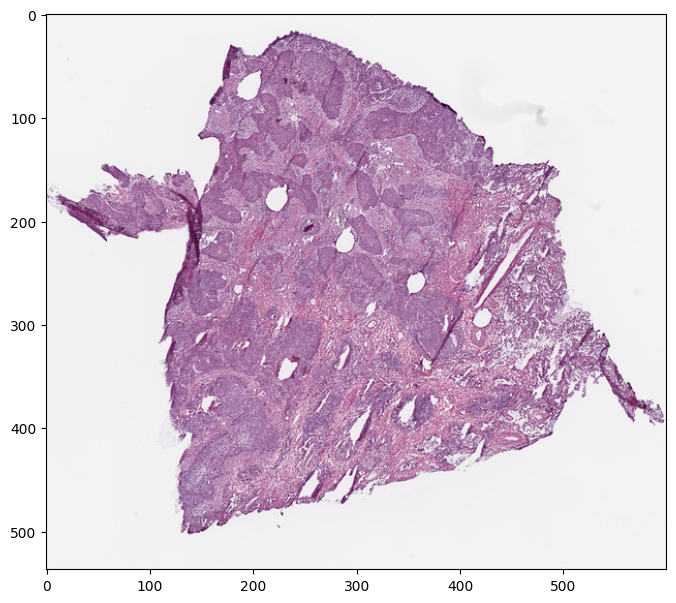

In [ ]:
wsi_predictions('a5dadfa8-26ab-40d7-b12e-c68a47f47aad/TCGA-96-8170-01A-01-TS1.1ad24fe9-758d-4a9d-8510-c1c73368b672.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '02/22/13', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-44-2656-11A-02-TS2', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '124875', 'aperio.Left': '27.709616', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '0.001550', 'aperio.MPP': '0.5040', 'aperio.OriginalHeight': '22103', 'aperio.OriginalWidth': '56000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1248CNTLR', 'aperio.StripeWidth': '1000', 'aperio.Time': '08:01:28', 'aperio.Time Zone': 'GMT-05:00', 'aperio.Title': 'TCGA-44-2656-11A-02-TS2', 'aperio.Top': '15.145385', 'aperio.User': 'c82321af-a56f-4728-9561-09ef9c7b64eb', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n56000x22103 [0,0 53444x22003] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth = 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[0.4395412332623413, 0.001448906249374011, 0.5590098544857219]

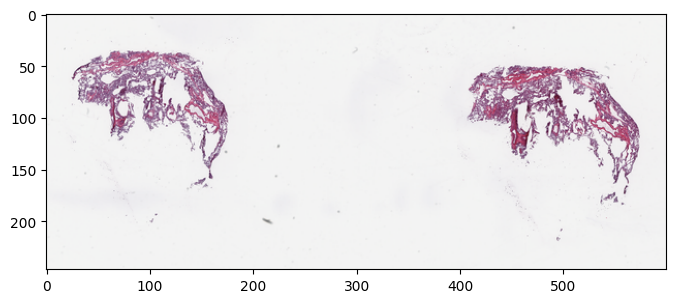

In [ ]:
wsi_predictions('cd539468-016b-4e65-96f1-9915d5191004/TCGA-44-2656-11A-03-TS3.E842A27F-1AE8-4E06-89C9-13105DBE5DC9.svs')

<_PropertyMap {'aperio.AppMag': '20', 'aperio.DSR ID': 'resc3-dsr2', 'aperio.Date': '02/14/13', 'aperio.DisplayColor': '0', 'aperio.Exposure Scale': '0.000001', 'aperio.Exposure Time': '109', 'aperio.Filename': 'TCGA-44-2656-11A-01-TS1', 'aperio.Focus Offset': '-0.001000', 'aperio.ICC Profile': 'ScanScope v1', 'aperio.ImageID': '124339', 'aperio.Left': '29.554193', 'aperio.LineAreaXOffset': '0.000000', 'aperio.LineAreaYOffset': '0.000000', 'aperio.LineCameraSkew': '0.001550', 'aperio.MPP': '0.5040', 'aperio.OriginalHeight': '13929', 'aperio.OriginalWidth': '61000', 'aperio.Parmset': 'GOG136 on O: Drive', 'aperio.ScanScope ID': 'SS1248CNTLR', 'aperio.StripeWidth': '1000', 'aperio.Time': '08:00:34', 'aperio.Time Zone': 'GMT-05:00', 'aperio.Title': 'TCGA-44-2656-11A-01-TS1', 'aperio.Top': '13.630596', 'aperio.User': '37538f4a-e250-4d24-9670-218f13099677', 'openslide.comment': 'Aperio Image Library v10.2.41\r\n61000x13929 [0,0 58216x13829] (256x256) JPEG/RGB Q=30|AppMag = 20|StripeWidth = 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

[0.8460905607789755, 0.0015248242496454622, 0.1523846084252]

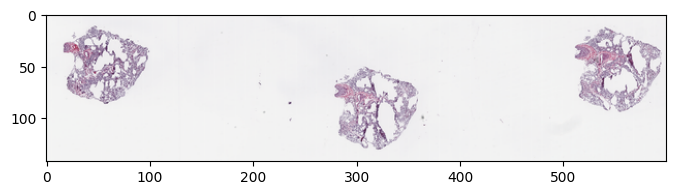

In [ ]:
wsi_predictions('036a0d0b-83b8-4144-9d81-63e5b0a61c6b/TCGA-44-2656-11A-02-TS2.8C5BE3BC-139F-4C79-97D2-0CC8A0EBA5F9.svs')

**Defining helper function for calculating ROC AUC and evaluating the predictions calculated above**

In [ ]:
from sklearn.metrics import roc_curve, auc
def calculate_roc_auc(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    return fpr, tpr, roc_auc

average = [0.0, 0.0, 0.0]
total = 0

total +=1

average = [x/total for x in average]
print(str(average))
print(str(threshold_predictions_details))
tile_predictions = np.reshape(average, (3))

fpr, tpr, roc_auc = calculate_roc_auc([0,1,0], average)

print(f" AUC: {roc_auc}")

In [ ]:
print(len(threshold_predictions_details))
print(str(colored_patch_count))

427
434


In [ ]:
import os
print(str(len(os.listdir('/content/patches_dir'))))

918


In [ ]:
average = [0.0, 0.0, 0.0]
total = 0
for elem in threshold_predictions_details:
  average[0] += elem[0]
  average[1] += elem[1]
  average[2] += elem[2]
  total +=1

average = [x/total for x in average]

print(str(average))

[9.099784950486743e-05, 0.6409511299055983, 0.3589578916318715]


In [ ]:
print(str(sum(threshold_predictions_details)/len(threshold_predictions_details)))

In [ ]:
def most_common(lst):
    return max(set(lst), key=lst.count)

In [ ]:
print(most_common(threshold_predictions))

2


In [ ]:
print(str(threshold_predictions.count(2)))

45


**Patching back together the tiles of WSI color-coded on the basis of patch-level subtype prediction**

In [ ]:
import cv2
import numpy as np
import os

def merge_images(directory, file_path):
    # Get a list of all the PNG files in the directory
    png_files = [f for f in os.listdir(directory) if f.endswith('.png') ]

    # Create an empty list to store the images
    images = []

    # Loop through the PNG files and load them into the list
    for png_file in png_files:
        if 'tcga_whole_slide_image' in png_file:
          # Extract the x and y coordinates from the file name
          x, y = map(int, png_file[:-4].split('_')[-2:])
          # Load the PNG file
          img = cv2.imread(os.path.join(directory, png_file))
          # Resize the image to (8, 8, 3)
          img = cv2.resize(img, (16, 16))
          # Add the image to the list
          images.append((x, y, img))

    # Sort the images by their x and y coordinates
    images.sort()

    # Get the dimensions of the final image
    x_min = min([x for x, y, img in images])
    x_max = max([x for x, y, img in images])
    y_min = min([y for x, y, img in images])
    y_max = max([y for x, y, img in images])
    width = (x_max - x_min + 1) * 16
    height = (y_max - y_min + 1) * 16

    # Create an empty image to hold the final image
    final_image = np.zeros((height, width, 3), dtype=np.uint8)

    # Loop through the images and paste them into the final image
    for x, y, img in images:
        x_offset = (x - x_min) * 16
        y_offset = (y - y_min) * 16
        final_image[y_offset:y_offset+16, x_offset:x_offset+16] = img

    # Make the final image
    image_version = Image.fromarray(final_image, 'RGB')
    converter = PIL.ImageEnhance.Color(image_version)
    enhanced_image = converter.enhance(2)
    enhanced_image_np_as_array = np.asarray(enhanced_image)
    r, g, b = cv2.split(enhanced_image_np_as_array)
    merged = cv2.merge([r, g, b])

    # Save the final image
    cv2.imwrite(file_path, merged)
    if not cv2.imwrite(file_path, merged):
     raise Exception("Could not write image")

    print('Merged, resized, and clearer image saved as final_image.png')

In [ ]:
merge_images('/content/TCGA-55-8619-01A-01-TS1.0dc030d8-c16e-4d3b-8bae-9f8ec5ab8962.svs', 'new_merged_wsi.jpg')

Merged, resized, and clearer image saved as final_image.png


In [ ]:
from google.colab import files as FILE
import os

FILE.download('/content/new_merged_wsi.jpg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Testing the patch-level aggregative predictions model for predicting subtype diagnosis from whole slide imaging files to create a diagnostic heat map**

In [ ]:
pip install np_utils


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 1.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for np_utils: filename=np_utils-0.6.0-py3-none-any.whl size=56439 sha256=b65ed1ee77a408027f305b4c22b4b0f772808ae49fa84b9bcfb514b591a0dcdb
  Stored in directory: /root/.cache/pip/wheels/b6/c7/50/2307607f44366dd021209f660045f8d51cb976514d30be7cc7
Successfully built np_utils


In [ ]:
import os
import numpy as np
import torch
# assign directory
directory = '/content/tcga_luad_image_tiles'
from matplotlib import pyplot as plt
model = torch.load("convmaxpooling88valaccuracymodel.pth")

def imshow(image, ax=None, title=None):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()

    # PyTorch tensors assume the color channel is the first dimension
    # but matplotlib assumes is the third dimension
    image = image.numpy().transpose((1, 2, 0))

    # Undo preprocessing
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    image = std * image + mean

    # Image needs to be clipped between 0 and 1 or it looks like noise when displayed
    image = np.clip(image, 0, 1)

    ax.imshow(image)

    return ax
# iterate over files in that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    tile = Image.open(f, mode='r').convert("RGB")
    print("SIZE: " + str(tile.size))
    if(tile.size == (224,224,3)):
      predictions = model.predict(np.asarray(tile))
      print("PREDICTIONS: " + str(predictions))
      plt.imshow(tile)

In [ ]:

import PIL.Image as Image
import os
import glob

# Get a list of all the files in the folder
image_files = os.listdir("./images")

# Get a list of all the files in the folder that match a certain pattern
image_files = glob.glob("./images/*.jpg")

# Create a list to store the images
images = []

new_image = Image.new('RGB', (width, height))

# Open each image file and add it to the list
for image_file in image_files:
  image1 = Image.open(image_file)
  width1 = image1.width
  height1 = image1.height
  x1 = image_file.split('_')[0][-1]
  y1 = image_file.split('_')[1]
  new_image.paste(image1, ((256*(x1-1)), (256*(y1-1))))

new_image.save('heatmap.jpg')

In [ ]:
from tensorflow import keras # POSSIBLE DELETE THIS CELL
from tensorflow.keras import layers
train_ds, val_ds = tf.keras.utils.image_dataset_from_directory(
    data_dir,
    validation_split=0.2,
    subset="both",
    seed=0,
    image_size=(224,224),
    batch_size=32,
    shuffle=True
)
def make_model(input_shape, num_classes):
    inputs = keras.Input(shape=input_shape)

    # Entry block
    x = layers.Conv2D(32, 2, padding="same")(inputs)
    x = layers.MaxPooling2D(pool_size=(2, 2), strides=(1, 1), padding='valid')(x)
    x = layers.Conv2D(32, 2, padding="same")(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(64, 2, padding="same")(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Conv2D(64, 2, padding="same")(x)
    x = layers.BatchNormalization()(x)

    x = layers.Conv2D(128, 2, padding="same")(x)
    x = layers.Dropout(0.2)(x)
    x = layers.MaxPooling2D(pool_size=(2, 2))(x)
    x = layers.Conv2D(128, 2, padding="same")(x)
    x = layers.BatchNormalization()(x)


    x = layers.Conv2D(32, 2, padding="same")(x)

    x = layers.Flatten()(x)
    x = layers.Dense(128, activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Dropout(0.3)(x)
    outputs = layers.Dense(32, activation='relu')(x)
    return keras.Model(inputs, outputs)


model = make_model(input_shape=(224,224,3) , num_classes=4)
keras.utils.plot_model(model, show_shapes=True)
epochs = 10

callbacks = [
    keras.callbacks.ModelCheckpoint("save_at_{epoch}.keras"),
]
opt = keras.optimizers.Adam(learning_rate=0.00)
model.compile(loss='sparse_categorical_crossentropy', optimizer=opt, metrics=['accuracy'])

model.fit(
    train_ds,
    epochs=epochs,
    callbacks=None,
    validation_data=val_ds,
)

**Creating a dictionary of all the svs (WSI) file paths and their "true label" based on subtype for ROC AUC calculations**

In [ ]:
import os
luad_directory = '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/luad'
lusc_directory = '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc'
normal_directory = '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/normal'
directories = [lusc_directory]

dict_list = []
true_labels = []
paths = []
for directory in directories:
  for filename in os.listdir(directory):
      f = os.path.join(directory, filename)
      true_labels.append(1)
      paths.append(str(f))

for i, true_label in enumerate(true_labels):
  wsi_dict = {'true_label': true_label, 'directory': str(paths[i])}
  dict_list.append(wsi_dict)

[{'true_label': 1, 'directory': '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc/tcga_lusc_enirely_tumorous_wsi_slide_validation_1.gz'}, {'true_label': 1, 'directory': '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc/tcga_lusc_entirely_tumorous_wsi_validation_2.gz'}, {'true_label': 1, 'directory': '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc/gdc_download_20231226_212500.979590.tar.gz'}, {'true_label': 1, 'directory': '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc/gdc_download_20231226_212545.090669.tar.gz'}, {'true_label': 1, 'directory': '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc/gdc_download_20231226_212629.193946.tar.gz'}, {'true_label': 1, 'directory': '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc/gdc_download_20231226_212707.431329.tar.gz'}, {'true_label': 1, 'directory': '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides/lusc/gdc_download_20231226_212806.551626.

In [ ]:
import os

dict_list = []
true_labels = []
paths = []
for f in new_tcga_lusc_files:
  true_labels.append(1)
  paths.append('/content/' + str(f))

for i, true_label in enumerate(true_labels):
  wsi_dict = {'true_label': true_label, 'directory': str(paths[i])}
  dict_list.append(wsi_dict)

print(str(dict_list))
normal_dict = dict_list[0]
print(normal_dict)

**Helper functions for running tile predictions and ROC AUC of the WSI-based subtype diagnosis model**

In [ ]:
def till_last_slash(string):
  last_slash_index = string.rfind("/")
  extracted_string = string
  if last_slash_index != -1:
      extracted_string = string[:last_slash_index]
  return extracted_string

In [ ]:
import numpy as np

def one_hot_encoding_3d(predictions):
    """
    argument - predictions: a list of 3 element lists
    return - one hot encoding list based on the element with the highest percentage
    """
    one_hot = []
    for pred in predictions:
        one_hot.append(np.zeros(len(pred)).tolist())
        one_hot[-1][np.argmax(pred)] = 1
    return one_hot


In [ ]:
## LUSC TRIALS
import os
import numpy as np
import keras
import shutil
from sklearn.metrics import roc_curve, auc
from keras.preprocessing import image
from keras.applications.vgg16 import VGG16, preprocess_input
import tarfile

# Load the model

def calculate_roc_auc(y_true, y_scores):
    fpr, tpr, _ = roc_curve(y_true, y_scores)
    roc_auc = auc(fpr, tpr)
    return fpr, tpr, roc_auc

# Assuming you have the true labels and the directory of tiles for each WSI
wsis = dict_list

tile_predictions_list = []
true_labels_list = []

for wsi in wsis:

    dir = wsi['directory']
    print("DIRECTORY: " + str(dir))

    new_dir = ''
    with tarfile.open(dir) as tar:
        tar.extractall()
        member = tar.getmembers()[1]
        print(str(member.name))
        name = member.name
        new_dir = '/content/'+str(member.name)

    tile_predictions = wsi_predictions(new_dir) # predictions at threshold of 90%
    print("TILE PREDICTIONS FOR THE DIR: " + str(tile_predictions))

    tile_predictions_list.append(tile_predictions)
    true_labels_list.append(wsi['true_label'])

true_labels_list = np.array(true_labels_list)
true_labels_list = keras.utils.to_categorical(true_labels_list)

tile_predictions_list = np.array(tile_predictions_list)

fpr, tpr, roc_auc = calculate_roc_auc(true_labels_list.ravel(), tile_predictions_list.ravel())
f1_score = f1_score(true_labels_list, one_hot_encoding_3d(tile_predictions_list), average=None)

print(f"AUC: {roc_auc}")
for x, y in zip(true_labels_list, one_hot_encoding_3d(tile_predictions_list)):
    print(x, y)

In [ ]:
import numpy as np

def f1_score_based_probability_fusion(model1_predictions, model2_predictions, model1_f1_scores, model2_f1_scores):
    # Concatenate the predictions of both models
    model_1_predictions_weighted_by_f1_score = [i*k for i,k in zip(model1_predictions, model1_f1_scores)]
    model_2_predictions_weighted_by_f1_score = [i*k for i,k in zip(model2_predictions, model2_f1_scores)]
    model_1_predictions_weighted_by_f1_score.pop(1)
    non_lcc_model_1_predictions = model_1_predictions_weighted_by_f1_score
    non_lcc_model_1_predictions[1], non_lcc_model_1_predictions[2] = non_lcc_model_1_predictions[2], non_lcc_model_1_predictions[1]
    concat = [a+b for a,b in zip(model_2_predictions_weighted_by_f1_score, non_lcc_model_1_predictions)]
    print(str(concat))
    total_luad_f1_score = model1_f1_scores[0] + model2_f1_scores[0]
    total_lusc_f1_score = model1_f1_scores[3] + model2_f1_scores[1]
    total_normal_f1_score = model1_f1_scores[2] + model2_f1_scores[2]
    concat[0] /= total_luad_f1_score
    concat[1] /= total_lusc_f1_score
    concat[2] /= total_normal_f1_score
    lcc_prediction = 1- np.sum(concat)
    final_probabilities = np.zeros(4)
    final_probabilities[0] = concat[0]
    final_probabilities[1] = lcc_prediction
    final_probabilities[2:4] = concat[1:3]

    return final_probabilities


**Running the hybrid deep learning model together using a custom dataset that pairs CT scans and Whole Slide Images on subtype to generate enhanced subtype diagnosis predictions after applying a late probability-based fusion approach to the individual predictions of the whole slide imaging based ML model and the CT scan based ML model**

In [ ]:
import os
import tarfile
import random
import shutil
import tensorflow as tf
from PIL import Image

ct_scan_model = tf.keras.models.load_model('/content/ctscan88valaccuracymodel.h5')
wsi_image_model = tf.keras.models.load_model('/content/save_at_3 (2).keras')
ct_scan_dir = '/content/drive/MyDrive/Colab Notebooks (1)/chest_cancer/test'
wsi_dir = '/content/drive/MyDrive/Colab Notebooks (1)/test_wsi_slides'
data_augmentation = tf.keras.Sequential([
    tf.keras.layers.CenterCrop(224, 224)
])

subtypes = [('adenocarcinoma_left.lower.lobe_T2_N0_M0_Ib', 'luad'), ('squamous.cell.carcinoma_left.hilum_T1_N2_M0_IIIa', 'lusc'), ('normal', 'normal')]
ct_scan_model_total_preds = []
wsi_model_total_preds = []
final_concat_predictions = []
squamous_cell_predictions = 0
acc_lusc_count = 0

prediction_dict = {'b9c9e1cf-fd52-4910-8676-cabe1523f92e/TCGA-44-6144-01A-01-TS1.0c14abeb-0023-4b75-9f81-3d0cadf37c47.svs': [0.0236757673182233, 0.9763213655223018, 2.8654849524353148e-06], '8f91f24c-b49d-4ca7-96d9-c5a49ec80593/TCGA-L4-A4E6-01A-01-TSA.4F4C72C6-8BB1-4608-BBCA-8CC29FC25BEB.svs': [0.950644272963206, 0.00046704826942383683, 0.048888675916629536], 'e2053840-4d14-4e2a-b53f-9935efe0e67f/TCGA-55-8619-01A-01-TS1.0dc030d8-c16e-4d3b-8bae-9f8ec5ab8962.svs': [0.9745395740261871, 0.02177765999385536, 0.003682770116760677], 'a6f50c04-3fa3-4fc3-8707-a793788906b9/TCGA-50-5072-01A-02-BS2.37dae380-2992-4773-8396-73ee1fc59547.svs': [0.8827670265675491, 0.027277385230603985, 0.08995558862917576], '4e98243c-03e9-4a5f-8c8e-befa318d5bd4/TCGA-55-7911-11A-01-TS1.a095ee17-993e-42a4-b1aa-bf44204029fc.svs': [0.9925416344150758, 0.0020455551665652344, 0.005412811274937959], 'fa098f77-9092-49be-973a-5ee1ca062e52/TCGA-97-7552-01A-01-TS1.65a251c4-b794-4fad-9c75-dcd048a50b5e.svs': [0.9894110985972859, 6.681238546957992e-06, 0.010582224044327147], '8e7f3173-530f-4336-9eb6-39db324548ae/TCGA-44-5643-01A-01-BS1.13ee8806-e27c-48a4-8d93-9a6a42668cd8.svs': [0.9067839361811156, 0.09182728815746713, 0.0013887757624257175], 'e72e1adc-f9c1-4338-bf4c-8f2c4e6bdeb2/TCGA-78-8662-01A-01-BS1.2681409e-d406-4adb-8fed-45ae60682a9f.svs': [0.01078012136183944, 0.9891317099428028, 8.816881587602512e-05], '03423a5d-cef4-4874-84a9-4c52456e41d8/TCGA-58-8392-01A-01-TS1.c95a52fa-d9db-401a-b8af-b42b894941e2.svs': [0.007123717480201949, 0.9928646490136357, 1.1633141193441947e-05], '1daf3fef-c259-4902-a702-3ab52788f070/TCGA-37-5819-01A-01-TS1.598457a2-deb3-4018-ac05-06bfada57374.svs': [0.9366843036638, 0.061808985096824136, 0.0015067137476175126], 'faf3dcc9-9c3d-42ba-8dcb-c7dcd62fdf1f/TCGA-96-A4JL-01A-01-TSA.3FA7182D-09EC-469A-92E2-EFFDC286913C.svs': [0.9851013097719581, 4.105847201558426e-06, 0.014894586425012499], '6a2b48f0-a8db-452a-b6e7-4eb343760fe8/TCGA-NC-A5HO-01A-01-TS1.62FF3313-6DFC-4F64-9E69-9D1C852A57D4.svs': [0.3148537063423325, 0.00015146460244608306, 0.6849948216010543], '71727bf1-b1b4-4d58-ae1d-e442303e07d4/TCGA-56-7223-01A-01-TS1.413074b3-0f68-4dc0-a4e9-b06f3525bf4f.svs': [0.05427431094972808, 0.8623278279381225, 0.08339786239561219], 'eb929b8b-fc95-4bf0-8450-8ba8f66569ab/TCGA-49-AARE-11A-01-TS1.DC9E89C9-86E8-452D-AD64-225A978B84E2.svs': [0.04185782761487644, 6.941809579815475e-05, 0.9580727443099022], '0dea7bf0-721e-4fb9-beef-3024093ec1b1/TCGA-44-6147-11A-05-TS5.41088AE2-F335-4BA2-B096-F9135208100D.svs': [0.9441894193490347, 0.0007704415594768458, 0.05504015584786733], '54aeca8d-c325-4548-8de6-e5af34429da6/TCGA-44-4112-11A-02-TSB.273D61E4-3585-4EF2-96E3-C854E2D231C1.svs': [0.8353039100766182, 0.0006048830602796972, 0.16409120695399387], '2911f945-af08-4509-8e58-5d03aa84736b/TCGA-49-AAR0-11A-01-TSA.0B0F6078-45B9-4BAC-91E3-560F55D5EBF0.svs': [0.25817458814492933, 0.00012081911742157519, 0.7417045996558888], '54078b9b-4ca0-416d-930d-85eef1ca43d8/TCGA-MN-A4N5-01A-01-TS1.A4B7035B-2419-404A-A13B-AA19CCAAB74D.svs': [0.9626128450036049, 0.0019830438680704296, 0.03540410509109885], 'f1b74edc-5117-4923-b156-91f04233adf0/TCGA-33-4586-01A-01-BS1.1616d67c-e61c-49b7-ad7f-a36bcbc0fa6d.svs': [0.9454367407557801, 0.0516605584237438, 0.00290270355423623], 'fd2c9b03-fc10-48c6-a202-394d84f53ce1/TCGA-56-7222-01A-01-TS1.59a625b5-d982-4ea9-a531-a73c42997546.svs': [0.9501549317639255, 0.02485440192953992, 0.02499066569269255]}

for subtype in subtypes:
    ct_scan_subtype_dir = os.path.join(ct_scan_dir, subtype[0])
    wsi_subtype_dir = os.path.join(wsi_dir, subtype[1])
    subtype_dataset = tf.keras.utils.image_dataset_from_directory(
    ct_scan_subtype_dir,
    seed=1337,
    labels='inferred',
    image_size=(224,224),
    label_mode=None,
    batch_size=1)
    count = 0
    for ct_scan_image in subtype_dataset:
        if count == 50:
            break

        wsi_images = [wsi_image for wsi_image in os.listdir(wsi_subtype_dir) if wsi_image.endswith('.gz')]
        wsi_image_path = ''
        if wsi_images:
            wsi_image = random.choice(wsi_images)
            wsi_image_path = os.path.join(wsi_subtype_dir, wsi_image)


        wsi_model_predictions = []
        name = ''
        with tarfile.open(wsi_image_path) as tar:
            tar.extractall()
            member = tar.getmembers()[1]
            print(str(member.name))
            name = member.name
            dir = '/content/'+str(member.name)
            print(str(dir))
            print("DIR: " + dir + " SUBTYPE: " + subtype[1])
            if subtype[1] != 'lusc':
              if name in prediction_dict:
                  wsi_model_predictions = prediction_dict[name]
              else:
                  print("RUNNING FOR: " + member.name)
                  wsi_model_predictions = wsi_predictions(dir)
                  prediction_dict[name] = wsi_model_predictions
            else:
              wsi_model_predictions = wsi_predictions(dir)
              prediction_dict[name] = wsi_model_predictions

        wsi_model_total_preds.append(wsi_model_predictions)
        ct_scan_model_predictions = ct_scan_model.predict(ct_scan_image)[0].tolist()
        print(ct_scan_model_predictions)
        print(wsi_model_predictions)
        ct_scan_model_total_preds.append(ct_scan_model_predictions)
        final_concat_prediction = f1_score_based_probability_fusion(ct_scan_model_predictions, wsi_model_predictions, [0.83, 0.84, 1.00, 0.83], [0.60869565, 0.36363636, 0.83333333])
        final_concat_predictions.append(final_concat_prediction)
        count += 1

        if(np.argmax(ct_scan_model_predictions) != np.argmax(wsi_model_predictions)):
          with open('/content/new_predictions_final.txt', 'a') as f:
            f.write(f'DISAGREEMENT - TRUE LABEL: {subtype[1]}')

        with open('/content/new_predictions_final.txt', 'a') as f:
            f.write(f'WSI SLIDE: {name}\n')
            f.write(f'CT Scan Predictions: {ct_scan_model_predictions} PATH TO CT SCAN IMAGE: {}\n')
            f.write(f'WSI Predictions: {wsi_model_predictions}\n')
            f.write(f'Final Concatenated Predictions: {final_concat_prediction}\n\n')

with open('/content/new_predictions_final.txt', 'a') as f:
  f.write(f'WSI SLIDE: {name}\n')
  f.write(f'CT Scan Predictions: {ct_scan_model_total_preds}\n')
  f.write(f'WSI Predictions: {wsi_model_total_preds}\n')
  f.write(f'Final Concatenated Predictions: {final_concat_predictions}\n\n')


In [ ]:
print(prediction_dict)

{'b9c9e1cf-fd52-4910-8676-cabe1523f92e/TCGA-44-6144-01A-01-TS1.0c14abeb-0023-4b75-9f81-3d0cadf37c47.svs': [0.0236757673182233, 0.9763213655223018, 2.8654849524353148e-06], '8f91f24c-b49d-4ca7-96d9-c5a49ec80593/TCGA-L4-A4E6-01A-01-TSA.4F4C72C6-8BB1-4608-BBCA-8CC29FC25BEB.svs': [0.950644272963206, 0.00046704826942383683, 0.048888675916629536], 'e2053840-4d14-4e2a-b53f-9935efe0e67f/TCGA-55-8619-01A-01-TS1.0dc030d8-c16e-4d3b-8bae-9f8ec5ab8962.svs': [0.9745395740261871, 0.02177765999385536, 0.003682770116760677], 'a6f50c04-3fa3-4fc3-8707-a793788906b9/TCGA-50-5072-01A-02-BS2.37dae380-2992-4773-8396-73ee1fc59547.svs': [0.8827670265675491, 0.027277385230603985, 0.08995558862917576], '4e98243c-03e9-4a5f-8c8e-befa318d5bd4/TCGA-55-7911-11A-01-TS1.a095ee17-993e-42a4-b1aa-bf44204029fc.svs': [0.9925416344150758, 0.0020455551665652344, 0.005412811274937959], 'fa098f77-9092-49be-973a-5ee1ca062e52/TCGA-97-7552-01A-01-TS1.65a251c4-b794-4fad-9c75-dcd048a50b5e.svs': [0.9894110985972859, 6.681238546957992e

**Calculating and comparing the ROC AUC and confusion matrices of the hybrid WSI+CT Scan model versus the individual WSI/CT Scan models.**

In [ ]:
import sklearn
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
print(str(wsi_model_total_preds))
print(str(ct_scan_model_total_preds))
print(str(final_concat_predictions))
true_labels = np.array([[1,0,0,0]]*50 + [[0,0,1,0]]*50 + [[0,0,0,1]]*50)
true_labels_normal = np.array([[1,0,0,0]]*50 + [[0,0,1,0]]*50 + [[0,0,0,1]]*50)
wsi_true_labels = np.array([[1,0,0]]*50 + [[0,1,0]]*50 + [[0,0,1]]*50)
ct_scan_true_labels = np.array([[1,0,0,0]]*50 + [[0,0,0,1]]*50 + [[0,0,1,0]]*50)

concat_true_labels_normal = np.array([0]*50 + [1]*50 + [2]*50)

fpr, tpr, roc_auc = calculate_roc_auc(true_labels.ravel(), np.array(final_concat_predictions).ravel())
fpr_cs, tpr_cs, roc_auc_ct_scans = calculate_roc_auc(ct_scan_true_labels.ravel(), np.array(ct_scan_model_total_preds).ravel())
fpr_ws, tpr_ws, roc_auc_wsi_slides = calculate_roc_auc(wsi_true_labels.ravel(), np.array(wsi_model_total_preds).ravel())

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='Fused Probabilty Model ROC curve (area = %0.2f)' % roc_auc)
plt.plot(fpr_cs, tpr_cs, color='green', lw=2, label='CT Scan Model ROC curve (area = %0.2f)' % roc_auc_ct_scans)
plt.plot(fpr_ws, tpr_ws, color='blue', lw=2, label='WSI CNN model ROC curve (area = %0.2f)' % roc_auc_wsi_slides)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

# hybrid model confusion matrix construction
print(concat_true_labels_normal)
final_concat_predictions_normal = [np.argmax(x)-1 if np.argmax(x) != 0 else 0 for x in final_concat_predictions]
len_4_final_preds = [np.argmax(x) for x in final_concat_predictions]
print(final_concat_predictions_normal)
confusion_matrix = sklearn.metrics.confusion_matrix(concat_true_labels_normal, final_concat_predictions_normal)
disp = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix, display_labels=['LUAD.', 'LUSC', 'normal'])

# ct scan model confusion matrix construction
ct_scan_model_preds = [np.argmax(x) if np.argmax(x) <= 1 else int(6 / np.argmax(x)) for x in ct_scan_model_total_preds]
print(str(ct_scan_model_preds))
print(str("CT SCAN PREDS"))
ct_scan_corresponding_normal_preds = np.array([0]*50 + [2]*50 + [3]*50)
print(str(np.unique(ct_scan_model_preds)))
print(str(ct_scan_corresponding_normal_preds))
confusion_matrix_cs = sklearn.metrics.confusion_matrix(ct_scan_corresponding_normal_preds, ct_scan_model_preds)
disp_2 = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_cs, display_labels=['LUAD.',  'LCC', 'LUSC', 'normal'])

# wsi model confusion matrix construction
wsi_scan_model_preds_normal = [np.argmax(x) for x in wsi_model_total_preds]
confusion_matrix_ws = sklearn.metrics.confusion_matrix(concat_true_labels_normal, wsi_scan_model_preds_normal)
disp_3 = ConfusionMatrixDisplay(confusion_matrix=confusion_matrix_ws, display_labels=['LUAD.', 'LUSC', 'normal'])

disp.plot()
disp_2.plot()
print("WSI SLIDE")
disp_3.plot()
print("FUSED ROC: " +str(roc_auc))
print("CT SCAN ROC: " +str(roc_auc_ct_scans))
print("WSI SLIDE ROC: " +str(roc_auc_wsi_slides))

In [ ]:
print(prediction_dict)

{'b9c9e1cf-fd52-4910-8676-cabe1523f92e/TCGA-44-6144-01A-01-TS1.0c14abeb-0023-4b75-9f81-3d0cadf37c47.svs': [0.0236757673182233, 0.9763213655223018, 2.8654849524353148e-06], '8f91f24c-b49d-4ca7-96d9-c5a49ec80593/TCGA-L4-A4E6-01A-01-TSA.4F4C72C6-8BB1-4608-BBCA-8CC29FC25BEB.svs': [0.950644272963206, 0.00046704826942383683, 0.048888675916629536], 'e2053840-4d14-4e2a-b53f-9935efe0e67f/TCGA-55-8619-01A-01-TS1.0dc030d8-c16e-4d3b-8bae-9f8ec5ab8962.svs': [0.9745395740261871, 0.02177765999385536, 0.003682770116760677], 'a6f50c04-3fa3-4fc3-8707-a793788906b9/TCGA-50-5072-01A-02-BS2.37dae380-2992-4773-8396-73ee1fc59547.svs': [0.8827670265675491, 0.027277385230603985, 0.08995558862917576], '4e98243c-03e9-4a5f-8c8e-befa318d5bd4/TCGA-55-7911-11A-01-TS1.a095ee17-993e-42a4-b1aa-bf44204029fc.svs': [0.9925416344150758, 0.0020455551665652344, 0.005412811274937959], 'fa098f77-9092-49be-973a-5ee1ca062e52/TCGA-97-7552-01A-01-TS1.65a251c4-b794-4fad-9c75-dcd048a50b5e.svs': [0.9894110985972859, 6.681238546957992e

In [ ]:
print(final_concat_predictions)

[array([9.57221913e-01, 4.10521375e-04, 3.60931821e-02, 6.27438346e-03]), array([9.54440949e-01, 1.61870777e-02, 2.84786865e-02, 8.93287023e-04]), array([0.57295672, 0.07902019, 0.02346421, 0.32455887]), array([5.84965441e-01, 1.17252624e-01, 2.97674885e-01, 1.07049782e-04])]
